# E3 Analysis

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Load the original datasets
df_fixations = pd.read_csv("list_of_fixations.csv")
df_variables = pd.read_csv("list_of_variables.csv")

# Rename 'subID' to 'file_name' for consistency
df_variables["file_name"] = df_variables["subID"]
df_variables = df_variables.drop(columns=["subID"])

df_fixations["file_name"] = df_fixations["subID"]
df_fixations = df_fixations.drop(columns=["subID"])

# Display first few rows for verification
print(df_variables.head())
print(df_fixations.head())

   Unnamed: 0  trial   sttime  sttime_rel variable     value   
0           1      1  4240644        5107    stim1  C102.jpg  \
1           2      1  4240644        5107    stim2  D102.jpg   
2           3      1  4240644        5107    stim3  D102.jpg   
3           4      1  4240644        5107    stim4  D102.jpg   
4           5      1  4240644        5107       RT     2.068   

                    file_name  
0  AV_01_2024_04_16_14_15.EDF  
1  AV_01_2024_04_16_14_15.EDF  
2  AV_01_2024_04_16_14_15.EDF  
3  AV_01_2024_04_16_14_15.EDF  
4  AV_01_2024_04_16_14_15.EDF  
   Unnamed: 0  trial   sttime   entime  sttime_rel  entime_rel  hstx  hsty   
0           1      1  4235549  4235722          12         185  -185   -44  \
1           2      1  4235867  4235961         330         424  -230  -444   
2           3      1  4236007  4236215         470         678  -445 -1713   
3           4      1  4236265  4236636         728        1099  -230   -61   
4           5      1  4236659  42

In [5]:
# Create a pivot table with trial and file_name as index
df_variables_wide = df_variables.pivot_table(index=['trial', 'file_name'], 
                                             columns='variable', 
                                             values='value', 
                                             aggfunc='first')

# Ensure trial is treated as a string to avoid dtype mismatches
df_fixations['trial'] = df_fixations['trial'].astype(str)
df_variables_wide.index = df_variables_wide.index.set_levels(df_variables_wide.index.levels[0].astype(str), level=0)

# Create a list of columns to map
columns_to_map = ["stimOrg", "responseKey", "stim1_pos", "stim2_pos", "stim3_pos", "stim4_pos"]

# Iterate through the columns and apply mapping dynamically
for col in columns_to_map:
    mapping = df_variables_wide[col].to_dict()
    df_fixations[col] = df_fixations.set_index(['trial', 'file_name']).index.map(mapping)

# Reset index if needed (optional)
df_fixations.reset_index(inplace=True)


# Filter data

In [6]:
# Function to extract the participant ID from the file_name
def extract_participant_id(file_name):
    """Extracts the participant number from file_name."""
    parts = file_name.split("_")
    if len(parts) > 1:
        return parts[1]
    return None

# List of participants to remove
participants_to_remove = {"04", "05", "06", "07", "08", "09", "10", "11", "12", "30", "60", "77"}

# Apply function to extract participant IDs
df_fixations["participant_id"] = df_fixations["file_name"].apply(extract_participant_id)
df_variables_wide["participant_id"] = df_variables_wide.index.get_level_values("file_name").map(extract_participant_id)

# Remove rows where extracted participant_id is in the removal list
df_fixations = df_fixations[~df_fixations["participant_id"].isin(participants_to_remove)]
df_variables_wide = df_variables_wide[~df_variables_wide["participant_id"].isin(participants_to_remove)]

# Drop the temporary column
df_fixations = df_fixations.drop(columns=["participant_id"])


# Heatmaps

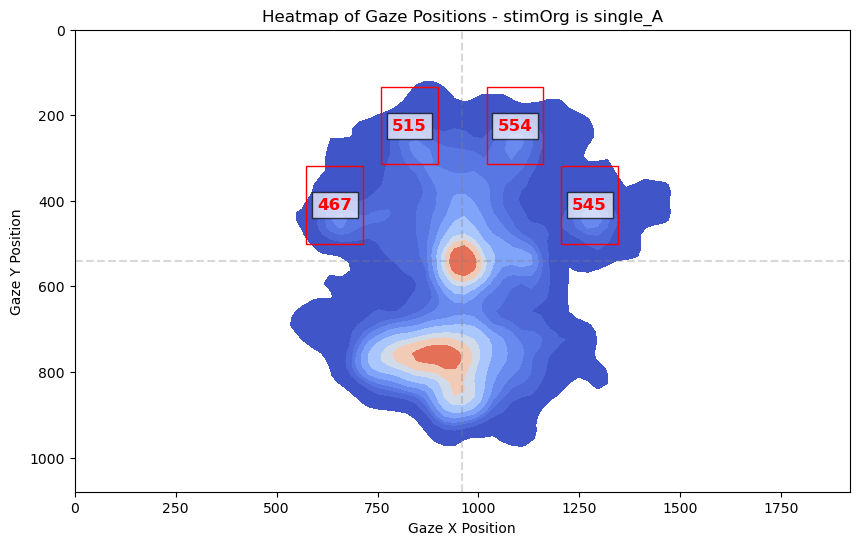

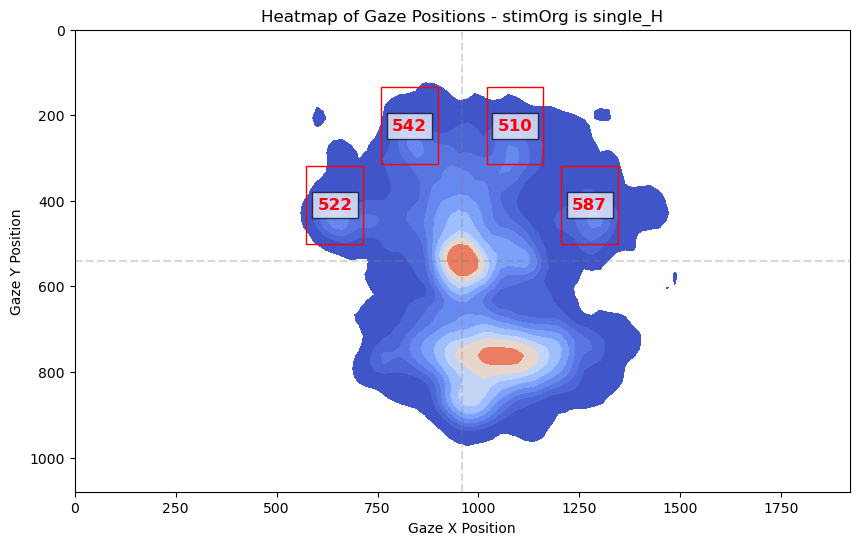

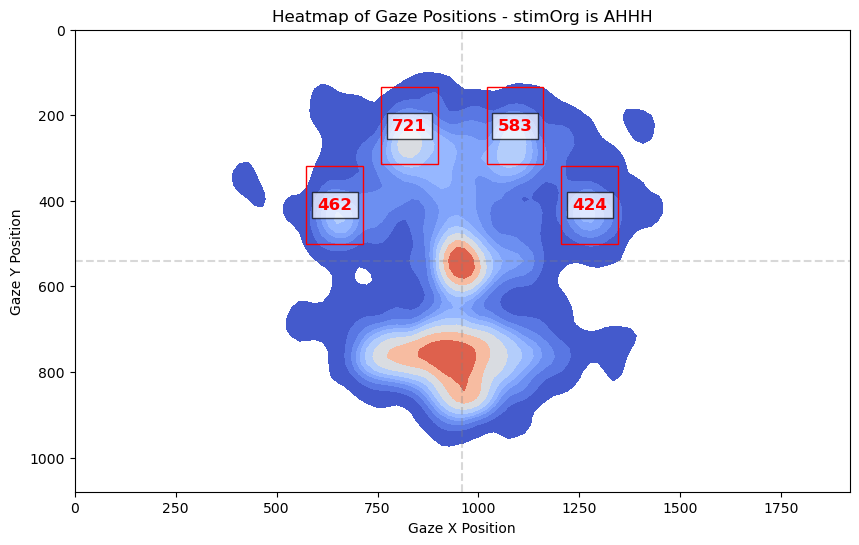

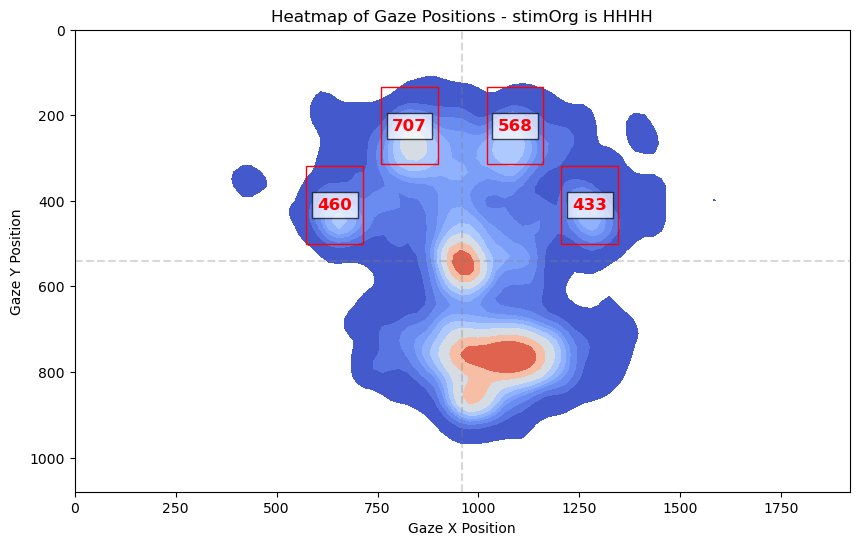

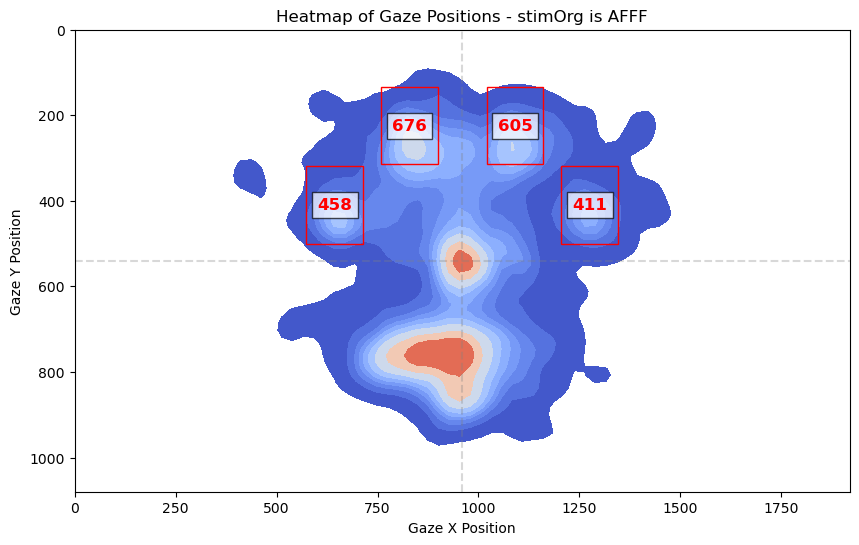

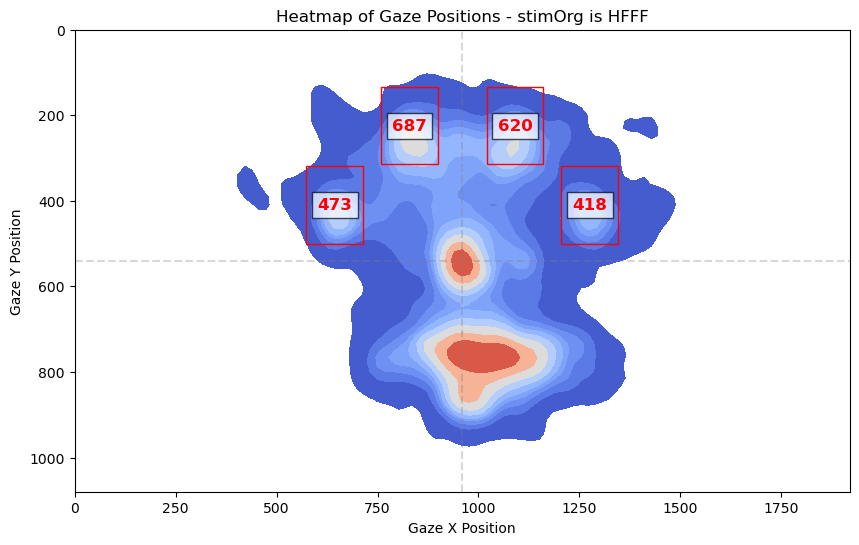

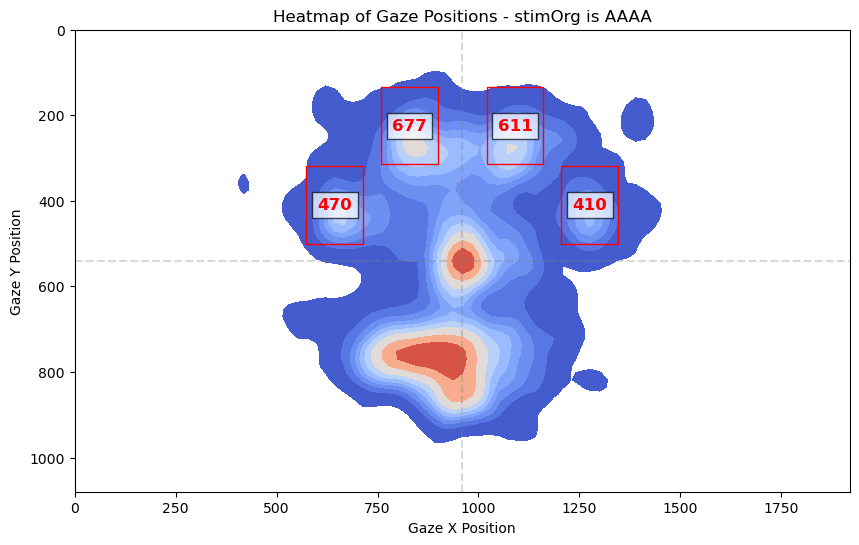

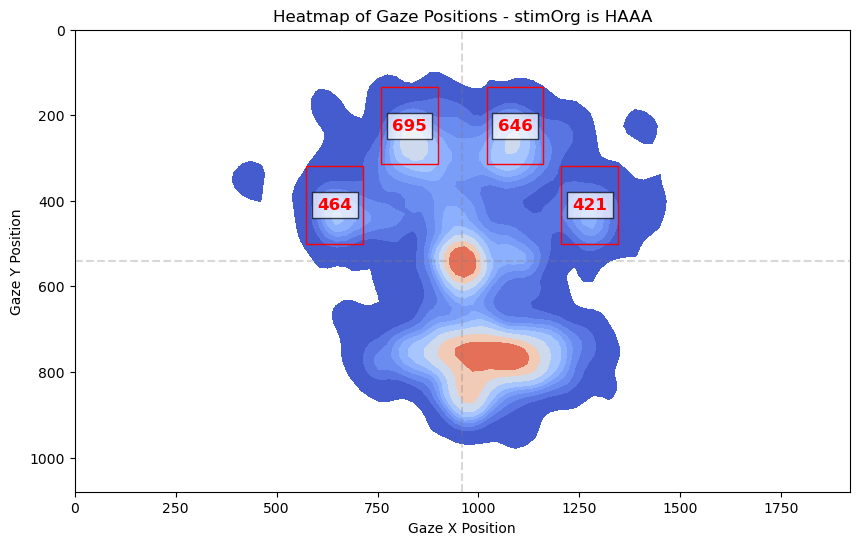

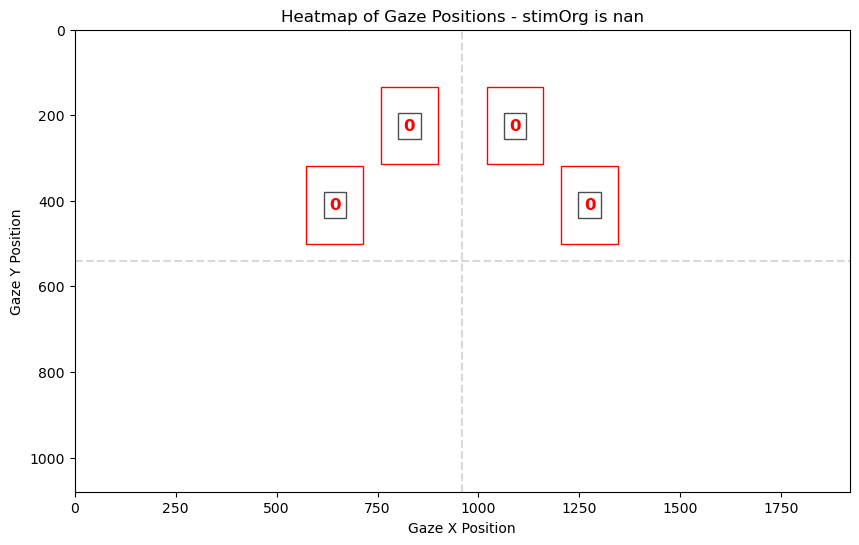

In [7]:
# Function to convert centered coordinates to screen coordinates
def centered_to_screen(x, y, screen_width=1920, screen_height=1080):
    center_x = screen_width / 2
    center_y = screen_height / 2
    return x + center_x - 70.5, center_y - y - 90.5

# Function to count fixations within a given rectangle
def count_fixations_in_box(fixations, box_x, box_y, box_width=141, box_height=181):
    """Count the number of fixations within a given rectangle."""
    x_min, x_max = box_x, box_x + box_width
    y_min, y_max = box_y, box_y + box_height
    return ((fixations['gavx'] >= x_min) & 
            (fixations['gavx'] <= x_max) & 
            (fixations['gavy'] >= y_min) & 
            (fixations['gavy'] <= y_max)).sum()

# Face positions in centered coordinates
face_positions = [[-315.47, 130.67], [-130.67, 315.47], [130.67, 315.47], [315.47, 130.67]]

for selected_stimOrg in df_fixations.stimOrg.unique():
    tmpdata = df_fixations[df_fixations.stimOrg == selected_stimOrg]
    tmpdata = tmpdata[['gavx', 'gavy']].dropna()
    
    plt.figure(figsize=(10, 6))
    
    sns.kdeplot(x=tmpdata['gavx'], y=tmpdata['gavy'], cmap="coolwarm", fill=True, bw_adjust=0.5)
    
    screen_positions = [centered_to_screen(x, y) for x, y in face_positions]
    
    for pos in screen_positions:
        box_x, box_y = pos
        num_fixations = count_fixations_in_box(tmpdata, box_x, box_y)
        
        rect = plt.Rectangle((box_x, box_y), 141, 181, linewidth=1, edgecolor='r', facecolor='none')
        plt.gca().add_patch(rect)
        
        plt.text(box_x + 70.5, box_y + 90.5, str(num_fixations), fontsize=12, color='red', 
                 ha='center', va='center', fontweight='bold', bbox=dict(facecolor='white', alpha=0.7))

    plt.title(f"Heatmap of Gaze Positions - stimOrg is {selected_stimOrg}")
    plt.xlabel("Gaze X Position")
    plt.ylabel("Gaze Y Position")
    plt.gca().invert_yaxis()
    plt.ylim(1080, 0)
    plt.xlim(0, 1920)
    
    plt.axhline(y=540, color='gray', linestyle='--', alpha=0.3)
    plt.axvline(x=960, color='gray', linestyle='--', alpha=0.3)

    plt.show()


# DF

In [8]:
# Define the mapping of coordinates to box numbers (left to right)
coord_to_box = {
    str([-315.47, 130.67]): 1,  # leftmost
    str([-130.67, 315.47]): 2,
    str([130.67, 315.47]): 3,
    str([315.47, 130.67]): 4   # rightmost
}

# Function to convert centered coordinates to screen coordinates
def centered_to_screen(x, y, screen_width=1920, screen_height=1080):
    center_x = screen_width / 2
    center_y = screen_height / 2
    return x + center_x - 70.5, center_y - y - 90.5  # Adjust offsets if necessary

# Face positions in centered coordinates
face_positions = [[-315.47, 130.67], [-130.67, 315.47], [130.67, 315.47], [315.47, 130.67]]

# Compute screen positions for face bounding boxes
screen_positions = [centered_to_screen(x, y) for x, y in face_positions]

# Function to count fixations within a given rectangle
def count_fixations_in_box(fixations, box_x, box_y, box_width=141, box_height=181):
    """Count the number of fixations within a given rectangle."""
    x_min, x_max = box_x, box_x + box_width
    y_min, y_max = box_y, box_y + box_height
    return ((fixations['gavx'] >= x_min) & 
            (fixations['gavx'] <= x_max) & 
            (fixations['gavy'] >= y_min) & 
            (fixations['gavy'] <= y_max)).sum()

# Analyze fixations
data = []

for file_name in df_fixations['file_name'].unique():
    for selected_stimOrg in df_fixations[df_fixations['file_name'] == file_name]['stimOrg'].unique():
        tmpdata = df_fixations[
            (df_fixations['file_name'] == file_name) & 
            (df_fixations['stimOrg'] == selected_stimOrg)
        ]
        
        if len(tmpdata) == 0:
            data.append({
                'file_name': file_name,
                'stimOrg': selected_stimOrg,
                'target_fixations': 0,
                'non_target_fixations': 0,
                'box_fixations': 0,
                'total_fixations': 0,
                'target_percentage': 0,
                'non_target_percentage': 0,
                'non_target_percentage_avg': 0
            })
            continue
            
        stim1_pos = tmpdata['stim1_pos'].iloc[0]
        target_box = coord_to_box.get(str(stim1_pos), None)

        if target_box is None:
            data.append({
                'file_name': file_name,
                'stimOrg': selected_stimOrg,
                'target_fixations': 0,
                'non_target_fixations': 0,
                'box_fixations': 0,
                'total_fixations': 0,
                'target_percentage': 0,
                'non_target_percentage': 0,
                'non_target_percentage_avg': 0
            })
            continue

        tmpdata_gaze = tmpdata[['gavx', 'gavy']].dropna()
        
        # Count fixations for each box
        box_counts = []
        for pos in screen_positions:
            box_x, box_y = pos
            count = count_fixations_in_box(tmpdata_gaze, box_x, box_y)
            box_counts.append(count)
        
        # Calculate total fixations and box fixations
        total_fixations = len(tmpdata_gaze)
        box_fixations = sum(box_counts)
        
        # Calculate percentages
        if box_fixations > 0:
            percentages = [count / box_fixations * 100 for count in box_counts]
        else:
            percentages = [0, 0, 0, 0]
            
        target_percentage = percentages[target_box - 1]
        non_target_boxes = [i for i in range(4) if i != target_box - 1]
        non_target_percentage = sum([percentages[i] for i in non_target_boxes])
        non_target_percentage_avg = np.mean([percentages[i] for i in non_target_boxes])
        target_fixations = box_counts[target_box - 1]  # Number of fixations on target box
        non_target_fixations = box_fixations - target_fixations  # Non-target fixations

        data.append({
            'file_name': file_name,
            'stimOrg': selected_stimOrg,
            'target_fixations': target_fixations,
            'non_target_fixations': non_target_fixations,
            'box_fixations': box_fixations,
            'total_fixations': total_fixations,
            'target_percentage': target_percentage,
            'non_target_percentage': non_target_percentage,
            'non_target_percentage_avg': non_target_percentage_avg
        })

# Create dataframe
df_fixation_counts = pd.DataFrame(data)
df_fixation_counts = df_fixation_counts.sort_values(['file_name', 'stimOrg'])

df_fixation_counts


,file_name,stimOrg,target_fixations,non_target_fixations,box_fixations,total_fixations,target_percentage,non_target_percentage,non_target_percentage_avg
6,AV_01_2024_04_16_14_15.EDF,AAAA,17,41,58,235,29.310345,70.689655,23.563218
4,AV_01_2024_04_16_14_15.EDF,AFFF,8,33,41,243,19.512195,80.487805,26.829268
2,AV_01_2024_04_16_14_15.EDF,AHHH,12,33,45,243,26.666667,73.333333,24.444444
7,AV_01_2024_04_16_14_15.EDF,HAAA,13,36,49,237,26.530612,73.469388,24.489796
5,AV_01_2024_04_16_14_15.EDF,HFFF,10,35,45,232,22.222222,77.777778,25.925926
...,...,...,...,...,...,...,...,...,...
493,AV_76_2024_06_06_13_09.EDF,HAAA,0,29,29,237,0.000000,100.000000,33.333333
490,AV_76_2024_06_06_13_09.EDF,HFFF,0,29,29,230,0.000000,100.000000,33.333333
494,AV_76_2024_06_06_13_09.EDF,HHHH,2,21,23,220,8.695652,91.304348,30.434783
489,AV_76_2024_06_06_13_09.EDF,single_A,20,13,33,376,60.606061,39.393939,13.131313


In [9]:
import pandas as pd
import numpy as np

# Function to count fixations within a given rectangle
def count_fixations_in_box(fixations, box_x, box_y, box_width=141, box_height=181):
    x_min, x_max = box_x, box_x + box_width
    y_min, y_max = box_y, box_y + box_height
    return ((fixations['gavx'] >= x_min) & 
            (fixations['gavx'] <= x_max) & 
            (fixations['gavy'] >= y_min) & 
            (fixations['gavy'] <= y_max)).sum()

# Initialize list to store data
data = []

for file_name in df_fixations['file_name'].unique():
    for selected_stimOrg in df_fixations[df_fixations['file_name'] == file_name]['stimOrg'].unique():
        tmpdata = df_fixations[
            (df_fixations['file_name'] == file_name) & 
            (df_fixations['stimOrg'] == selected_stimOrg)
        ]
        
        if len(tmpdata) == 0:
            data.append({
                'file_name': file_name,
                'stimOrg': selected_stimOrg,
                'target_fixations': 0,
                'non_target_fixations': 0,
                'box_fixations': 0,
                'total_fixations': 0,
                'target_percentage': 0,
                'non_target_percentage': 0,
                'non_target_percentage_avg': 0
            })
            continue
        
        stim1_pos = tmpdata['stim1_pos'].iloc[0]
        stim1_pos_str = str(stim1_pos)
        target_box = coord_to_box.get(stim1_pos_str, None)
        
        if target_box is None:
            data.append({
                'file_name': file_name,
                'stimOrg': selected_stimOrg,
                'target_fixations': 0,
                'non_target_fixations': 0,
                'box_fixations': 0,
                'total_fixations': 0,
                'target_percentage': 0,
                'non_target_percentage': 0,
                'non_target_percentage_avg': 0
            })
            continue
        
        tmpdata_gaze = tmpdata[['gavx', 'gavy']].dropna()
        
        # Count fixations for each box
        box_counts = []
        for pos in screen_positions:
            box_x, box_y = pos
            count = count_fixations_in_box(tmpdata_gaze, box_x, box_y)
            box_counts.append(count)
        
        total_fixations = len(tmpdata_gaze)
        box_fixations = sum(box_counts)
        
        if box_fixations > 0:
            percentages = [count / box_fixations * 100 for count in box_counts]
        else:
            percentages = [0, 0, 0, 0]
            
        target_percentage = percentages[target_box - 1]
        non_target_boxes = [i for i in range(4) if i != target_box - 1]
        non_target_percentage = sum([percentages[i] for i in non_target_boxes])
        non_target_percentage_avg = np.mean([percentages[i] for i in non_target_boxes])
        
        # Ensure accurate target fixations count by explicitly filtering target box fixations
        target_x, target_y = screen_positions[target_box - 1]
        target_fixations = count_fixations_in_box(tmpdata_gaze, target_x, target_y)
        non_target_fixations = box_fixations - target_fixations
        
        # Debugging output
        print(f"Processing: {file_name}, StimOrg: {selected_stimOrg}")
        print(f"Stim1 Pos: {stim1_pos}, Target Box: {target_box}")
        print(f"Box Counts: {box_counts}, Target Fixations (Recalculated): {target_fixations}")
        print(f"Screen Positions: {screen_positions}")

        data.append({
            'file_name': file_name,
            'stimOrg': selected_stimOrg,
            'target_fixations': target_fixations,
            'non_target_fixations': non_target_fixations,
            'box_fixations': box_fixations,
            'total_fixations': total_fixations,
            'target_percentage': target_percentage,
            'non_target_percentage': non_target_percentage,
            'non_target_percentage_avg': non_target_percentage_avg
        })

# Create dataframe
df_fixation_counts = pd.DataFrame(data)
df_fixation_counts = df_fixation_counts.sort_values(['file_name', 'stimOrg'])


df_fixation_counts


Processing: AV_01_2024_04_16_14_15.EDF, StimOrg: single_A
Stim1 Pos: [130.67, 315.47], Target Box: 3
Box Counts: [7, 16, 10, 14], Target Fixations (Recalculated): 10
Screen Positions: [(574.03, 318.83000000000004), (758.83, 134.02999999999997), (1020.1700000000001, 134.02999999999997), (1204.97, 318.83000000000004)]
Processing: AV_01_2024_04_16_14_15.EDF, StimOrg: single_H
Stim1 Pos: [315.47, 130.67], Target Box: 4
Box Counts: [13, 11, 8, 10], Target Fixations (Recalculated): 10
Screen Positions: [(574.03, 318.83000000000004), (758.83, 134.02999999999997), (1020.1700000000001, 134.02999999999997), (1204.97, 318.83000000000004)]
Processing: AV_01_2024_04_16_14_15.EDF, StimOrg: AHHH
Stim1 Pos: [-315.47, 130.67], Target Box: 1
Box Counts: [12, 11, 10, 12], Target Fixations (Recalculated): 12
Screen Positions: [(574.03, 318.83000000000004), (758.83, 134.02999999999997), (1020.1700000000001, 134.02999999999997), (1204.97, 318.83000000000004)]
Processing: AV_01_2024_04_16_14_15.EDF, StimOrg:

,file_name,stimOrg,target_fixations,non_target_fixations,box_fixations,total_fixations,target_percentage,non_target_percentage,non_target_percentage_avg
6,AV_01_2024_04_16_14_15.EDF,AAAA,17,41,58,235,29.310345,70.689655,23.563218
4,AV_01_2024_04_16_14_15.EDF,AFFF,8,33,41,243,19.512195,80.487805,26.829268
2,AV_01_2024_04_16_14_15.EDF,AHHH,12,33,45,243,26.666667,73.333333,24.444444
7,AV_01_2024_04_16_14_15.EDF,HAAA,13,36,49,237,26.530612,73.469388,24.489796
5,AV_01_2024_04_16_14_15.EDF,HFFF,10,35,45,232,22.222222,77.777778,25.925926
...,...,...,...,...,...,...,...,...,...
493,AV_76_2024_06_06_13_09.EDF,HAAA,0,29,29,237,0.000000,100.000000,33.333333
490,AV_76_2024_06_06_13_09.EDF,HFFF,0,29,29,230,0.000000,100.000000,33.333333
494,AV_76_2024_06_06_13_09.EDF,HHHH,2,21,23,220,8.695652,91.304348,30.434783
489,AV_76_2024_06_06_13_09.EDF,single_A,20,13,33,376,60.606061,39.393939,13.131313


# Scanpaths

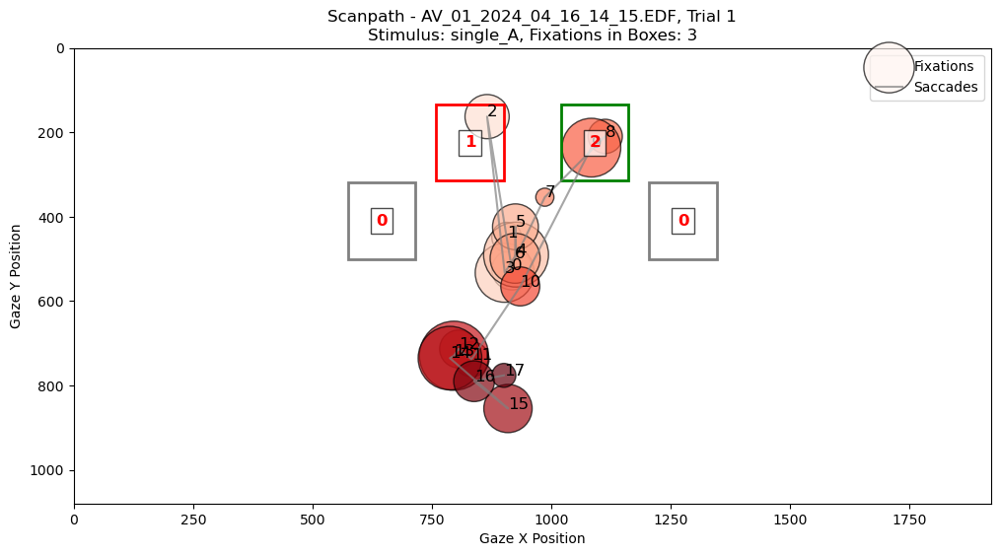

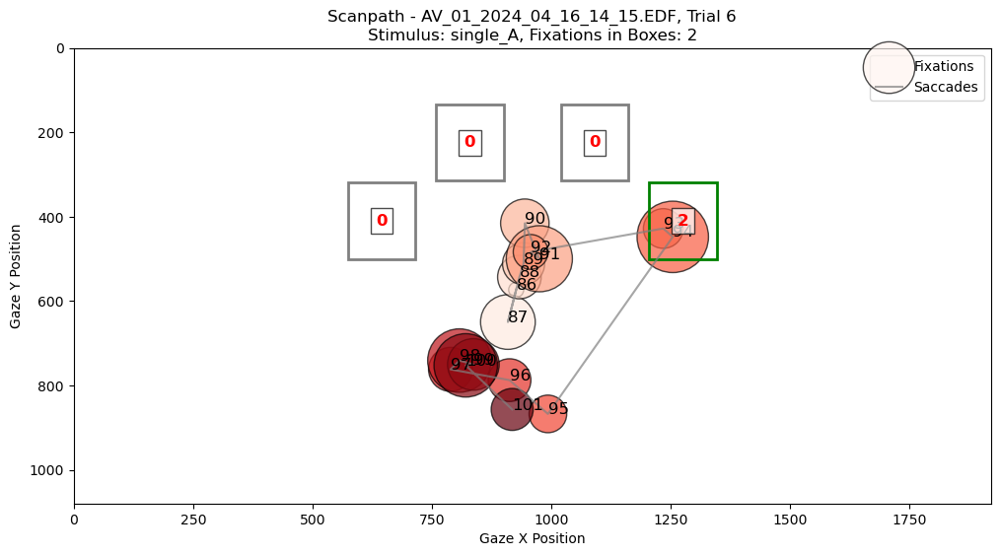

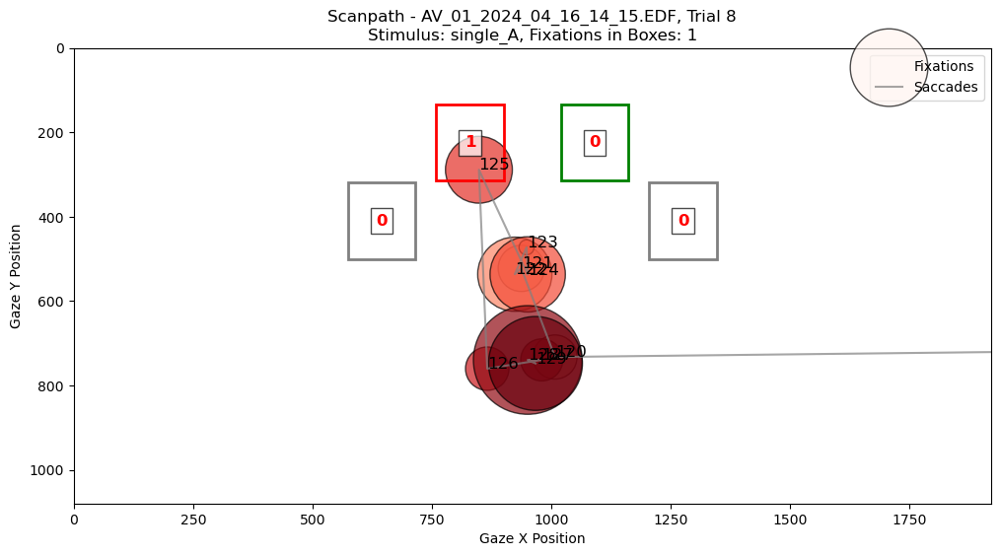

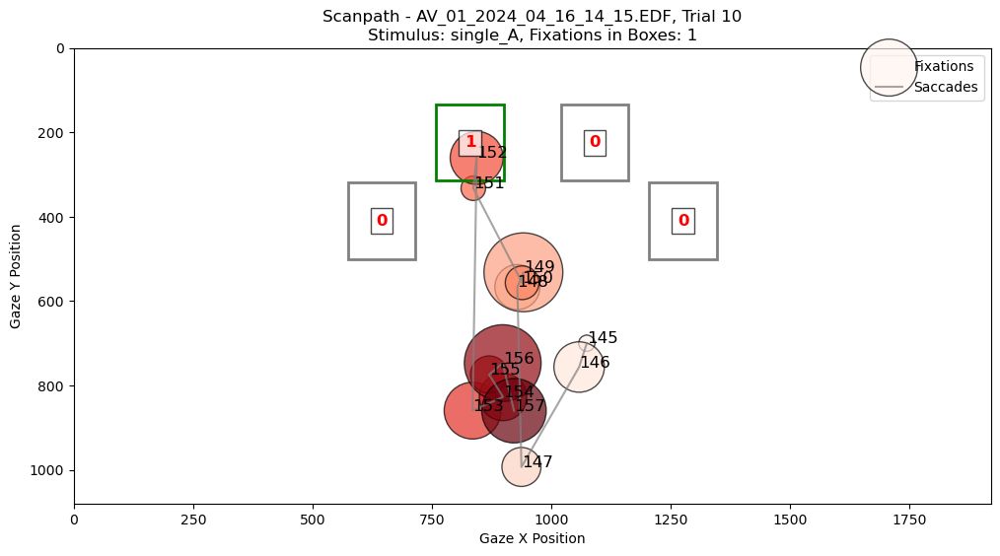

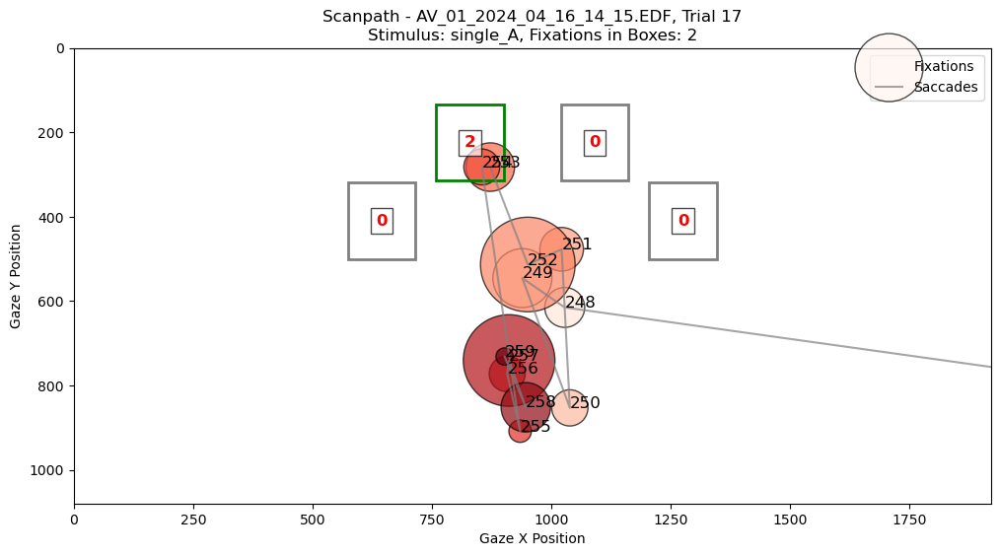

...

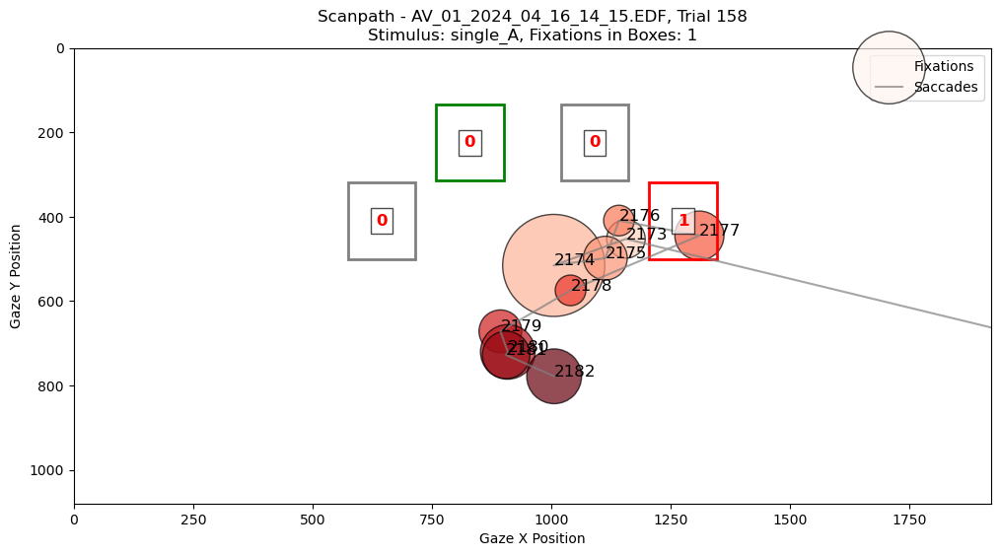

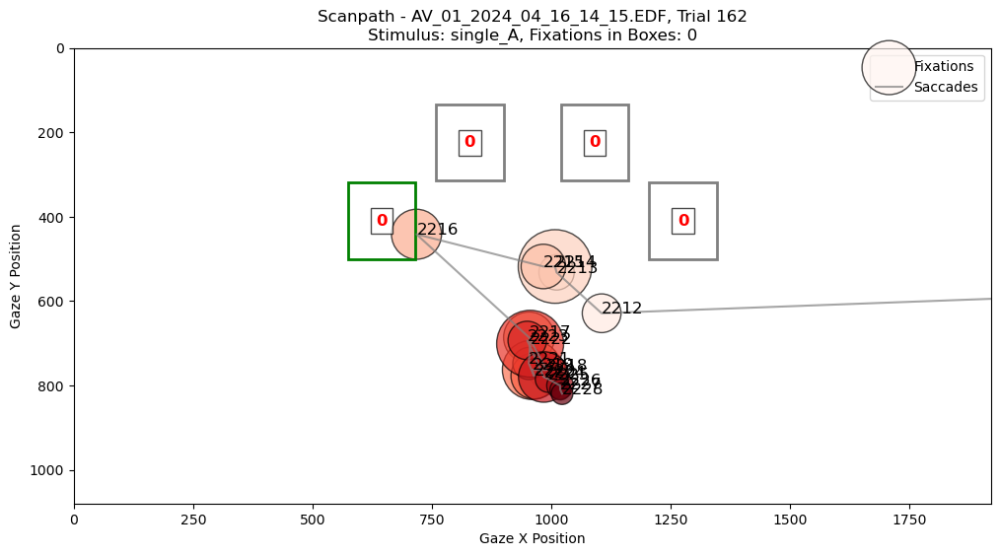

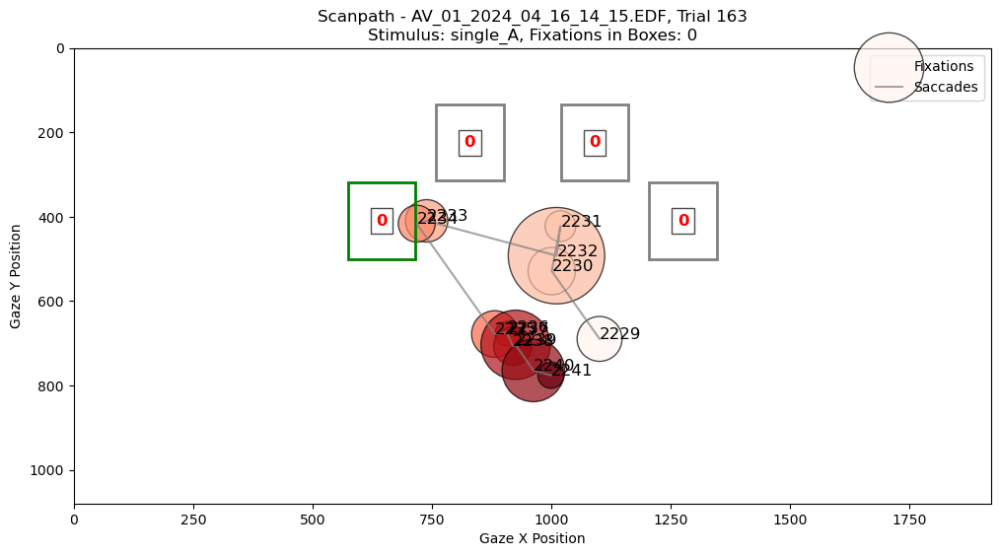

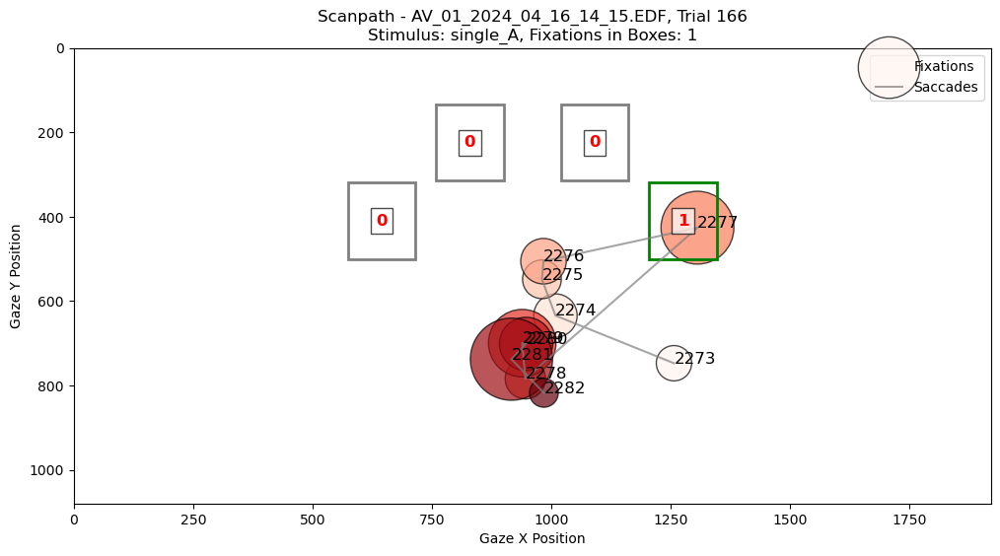

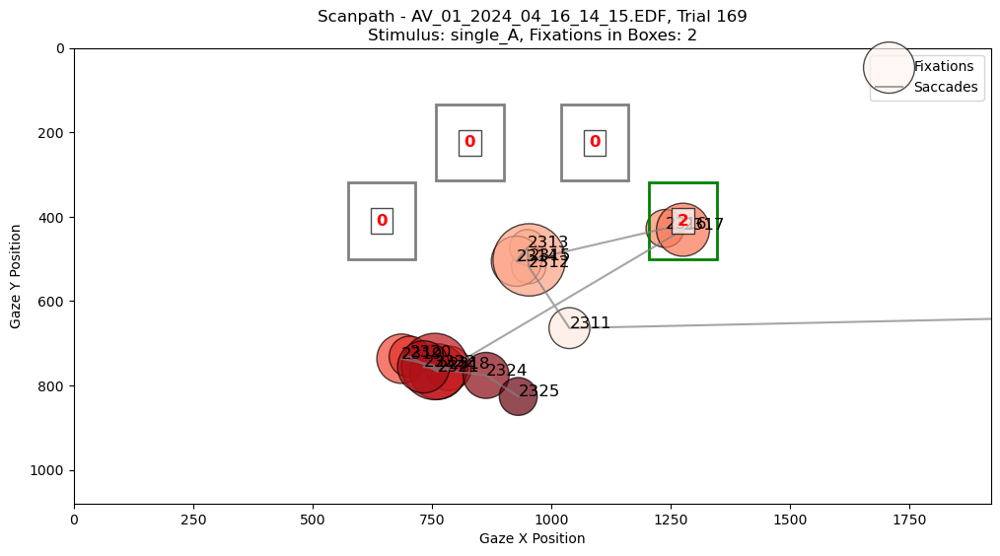

Total Fixations for Participant AV_01_2024_04_16_14_15.EDF, StimOrg single_A: 0
Total Fixations in Boxes for Participant AV_01_2024_04_16_14_15.EDF, StimOrg single_A: 47



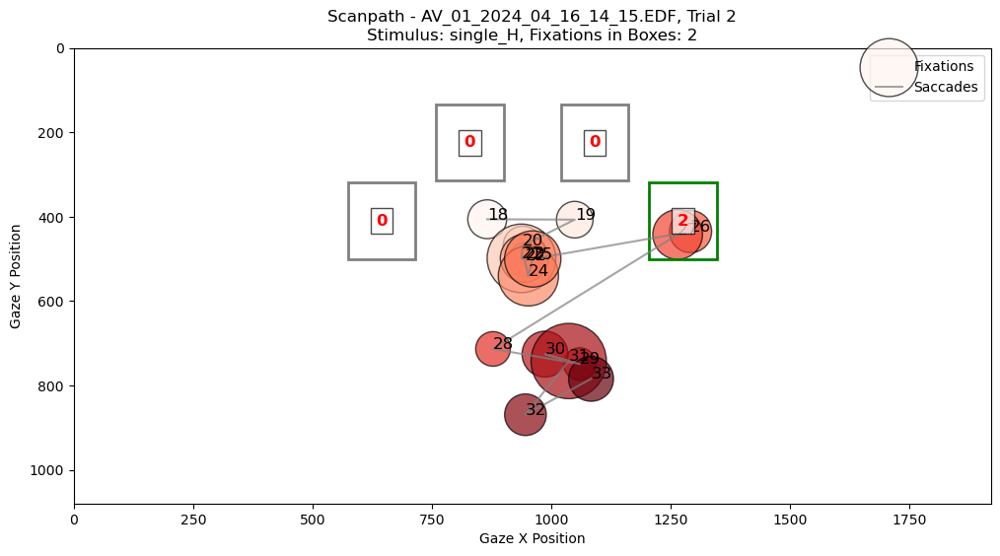

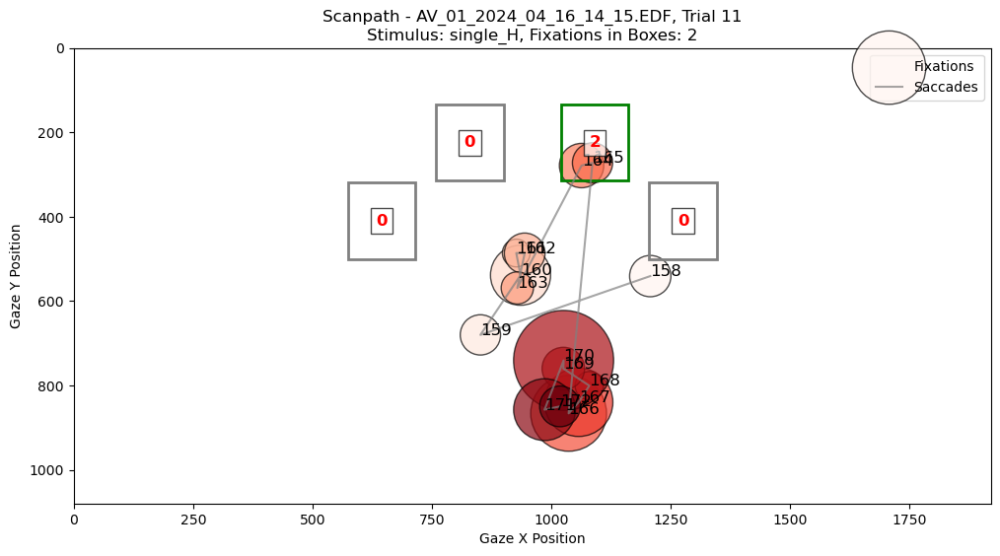

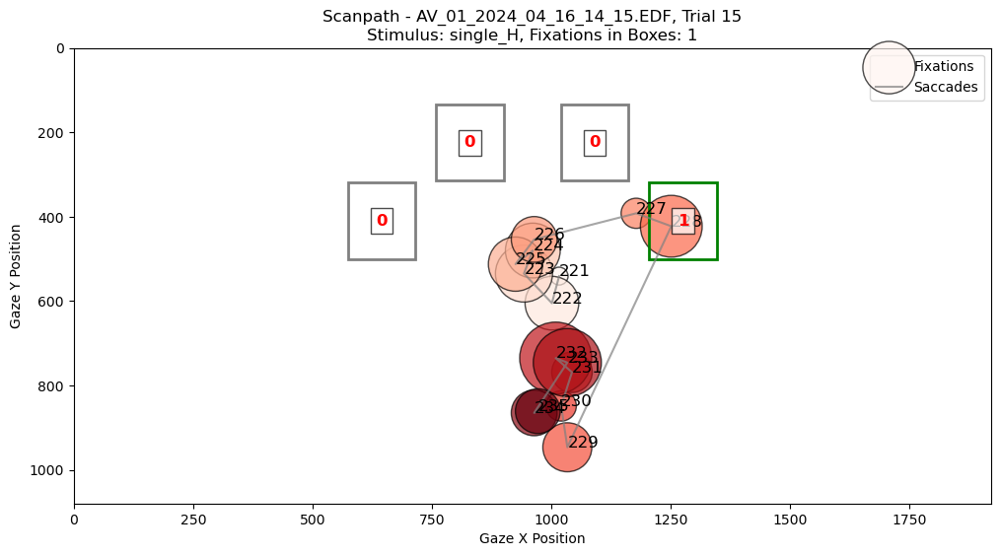

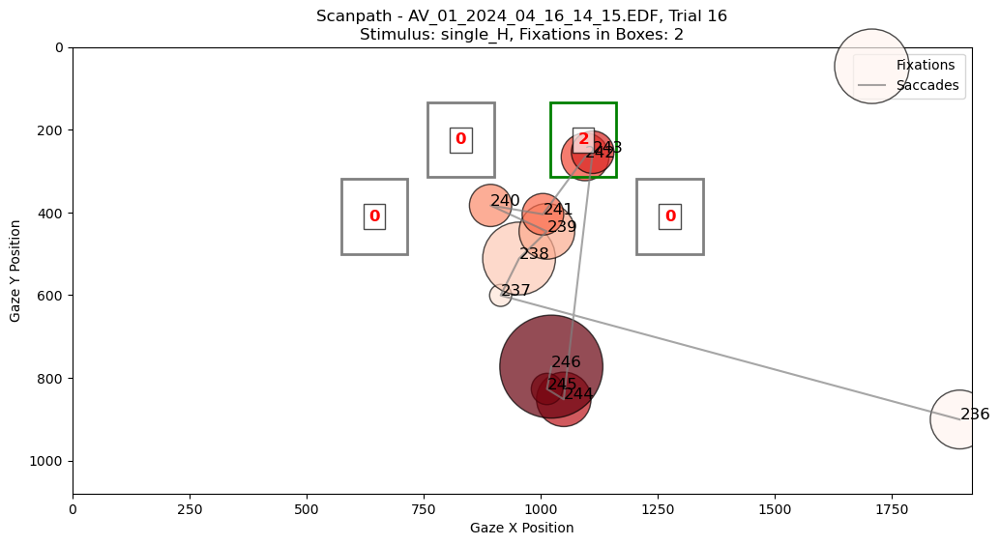

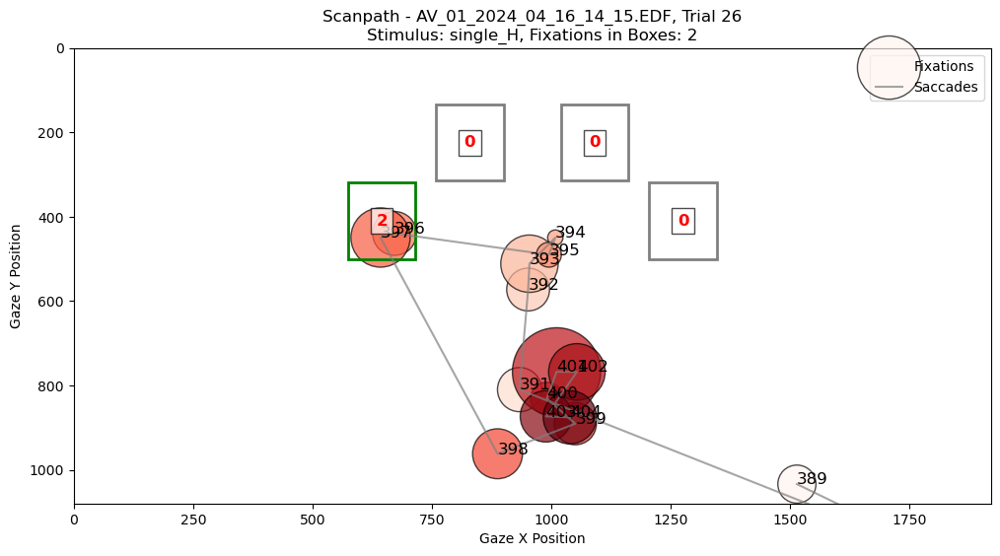

...

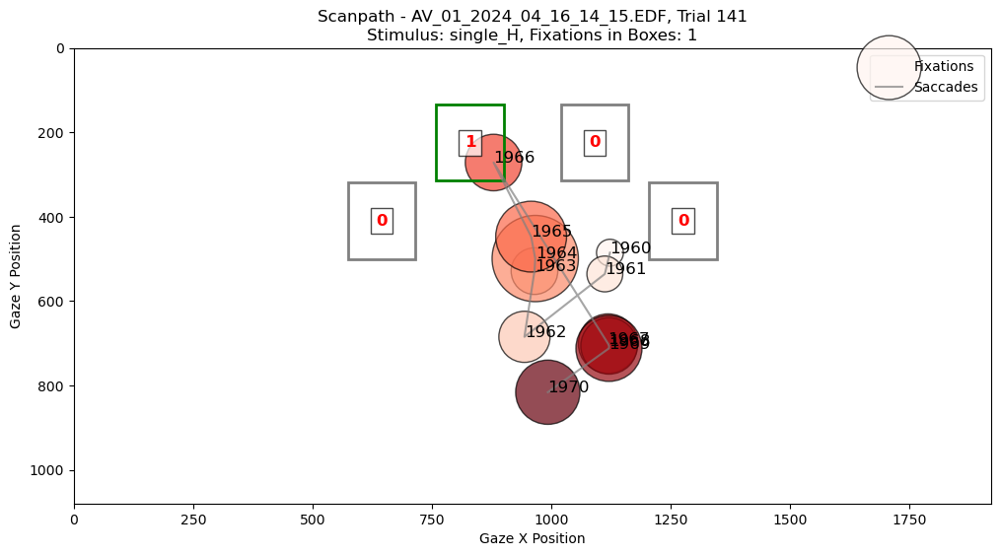

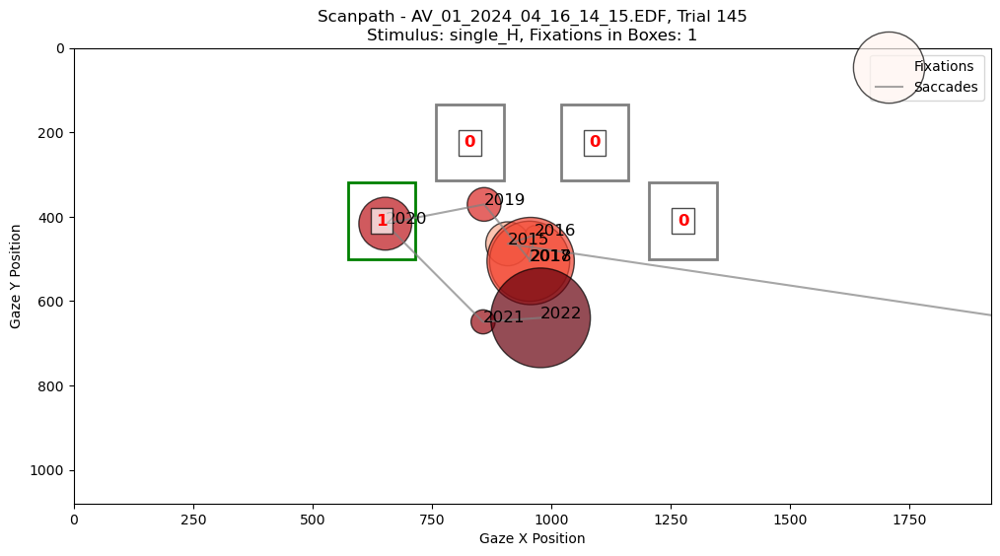

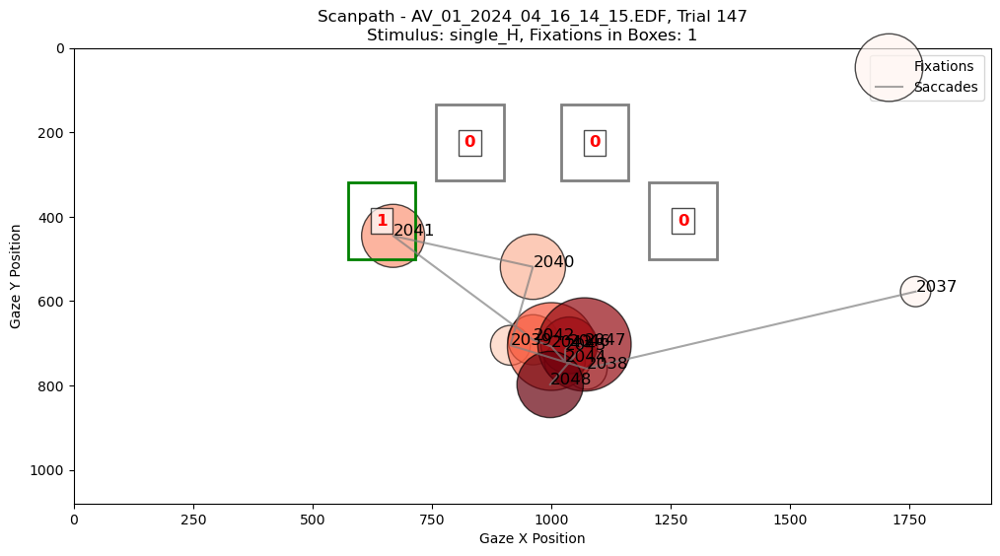

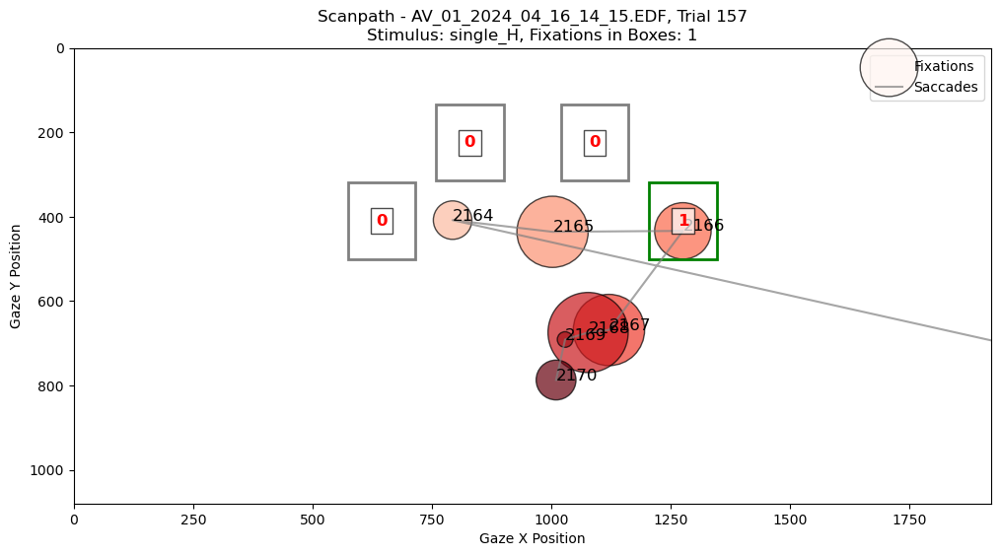

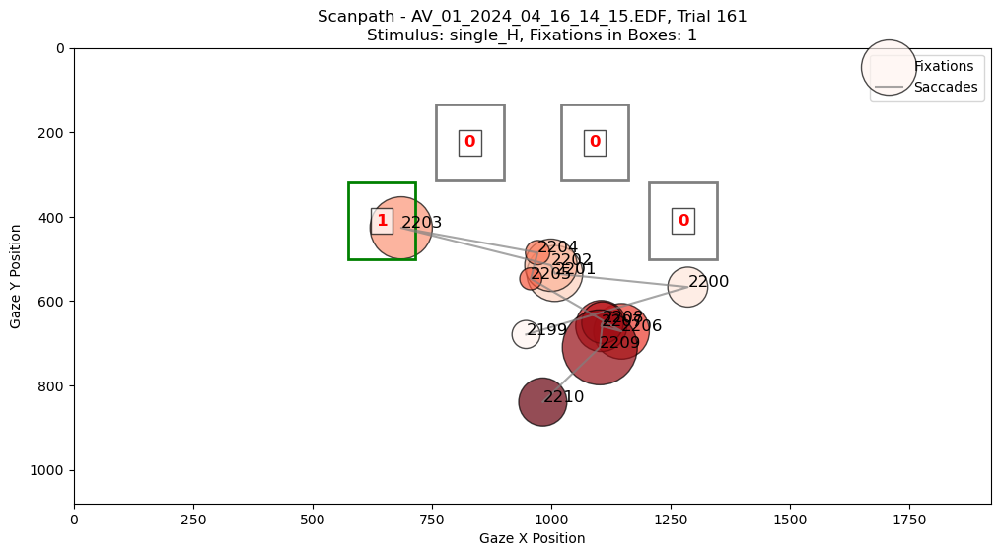

Total Fixations for Participant AV_01_2024_04_16_14_15.EDF, StimOrg single_H: 0
Total Fixations in Boxes for Participant AV_01_2024_04_16_14_15.EDF, StimOrg single_H: 42



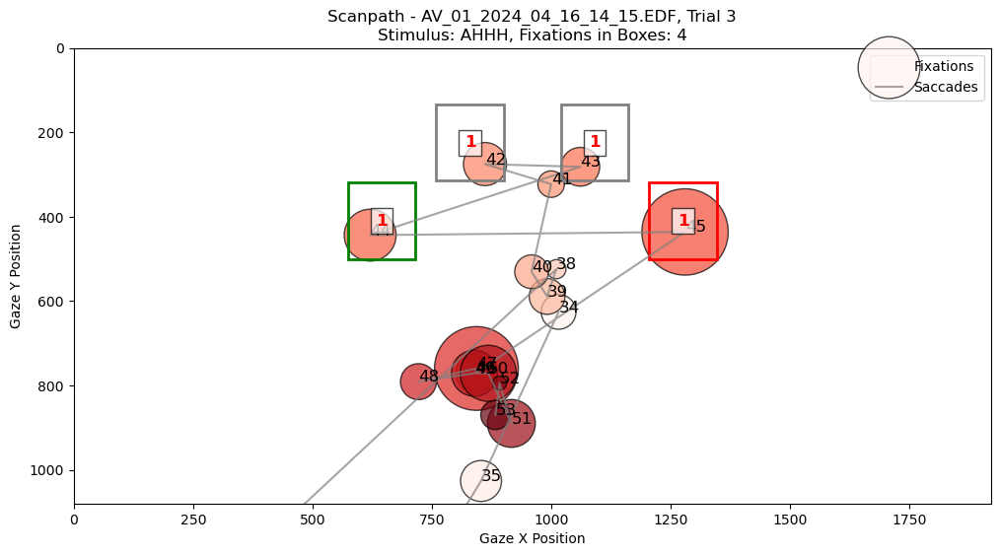

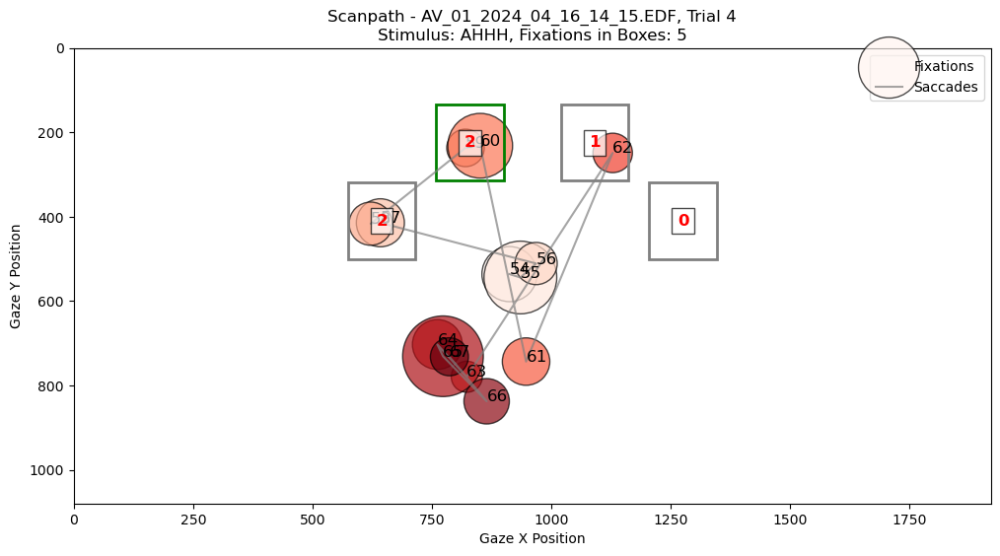

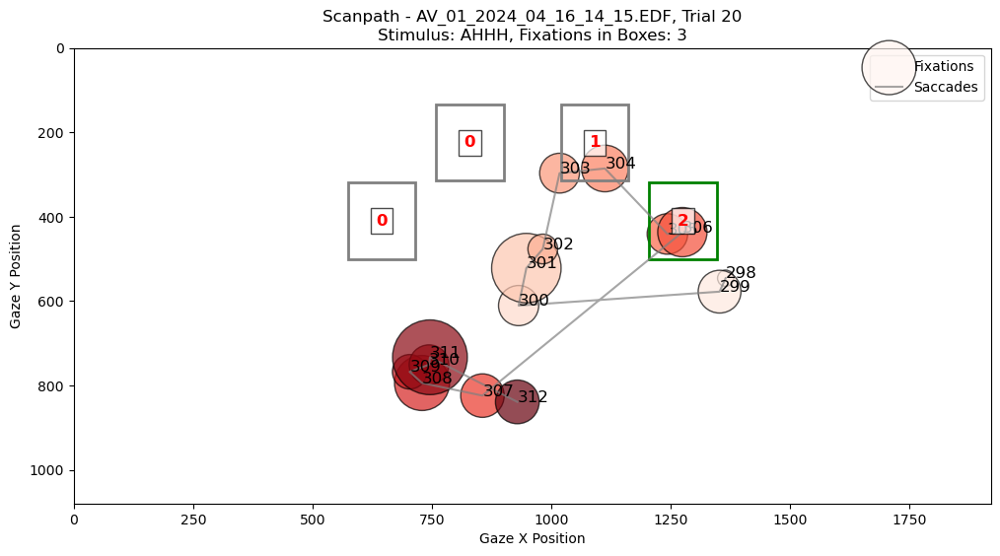

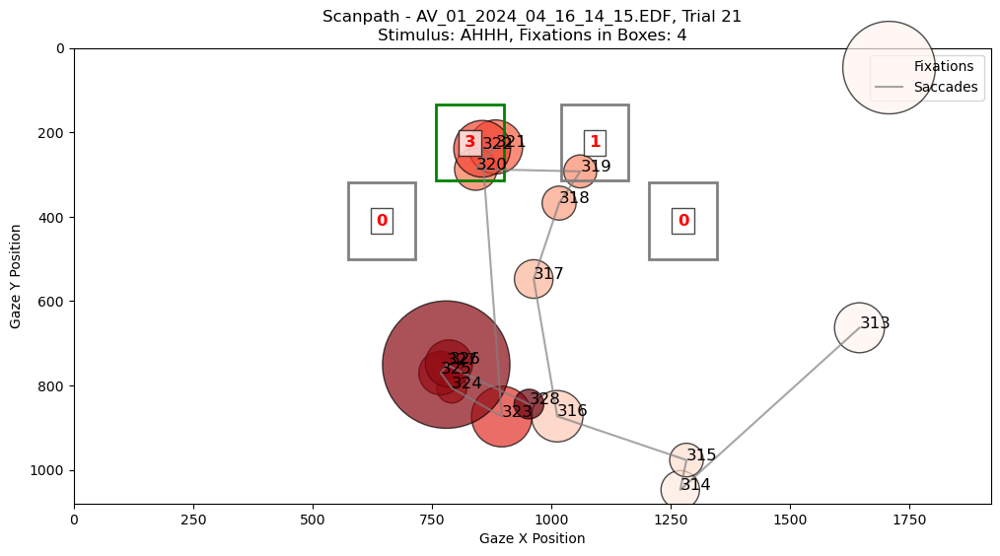

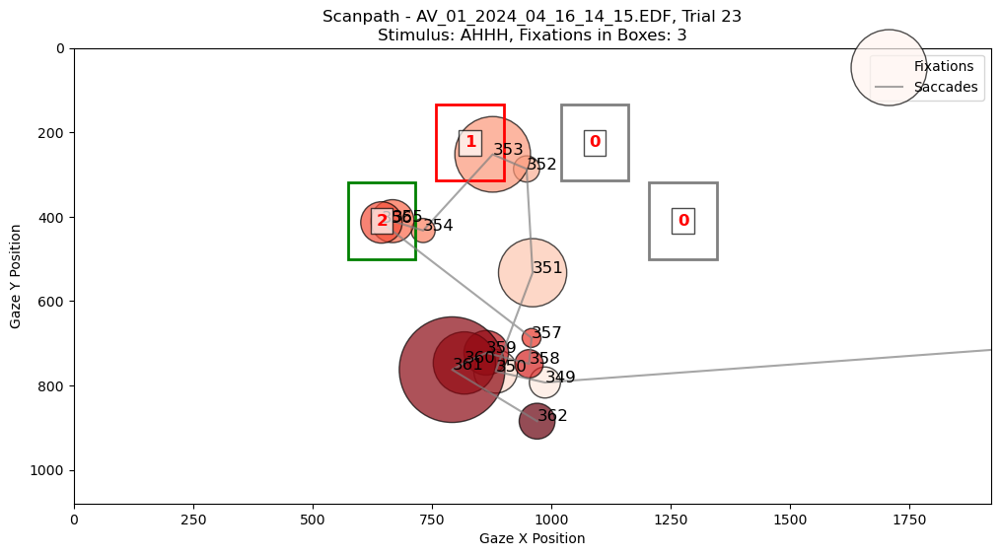

...

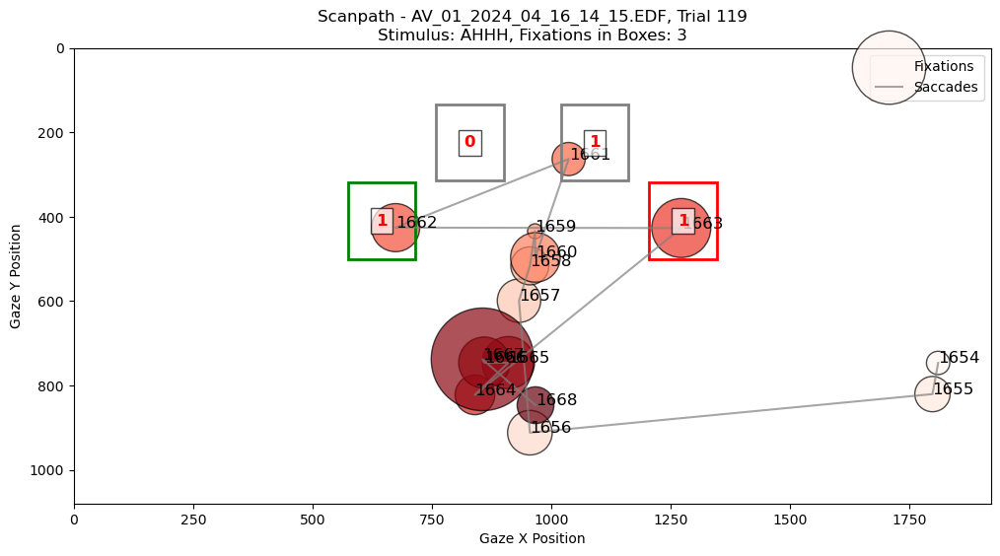

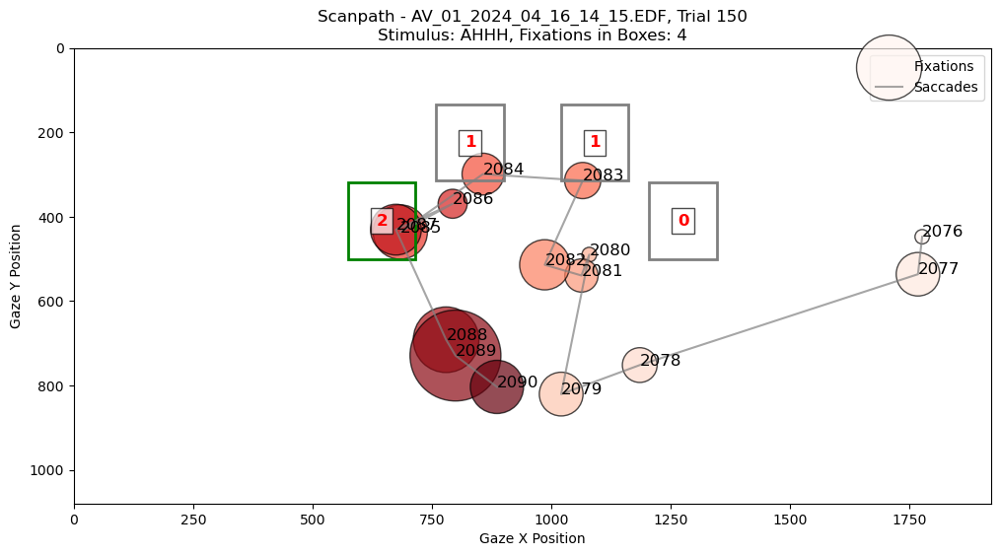

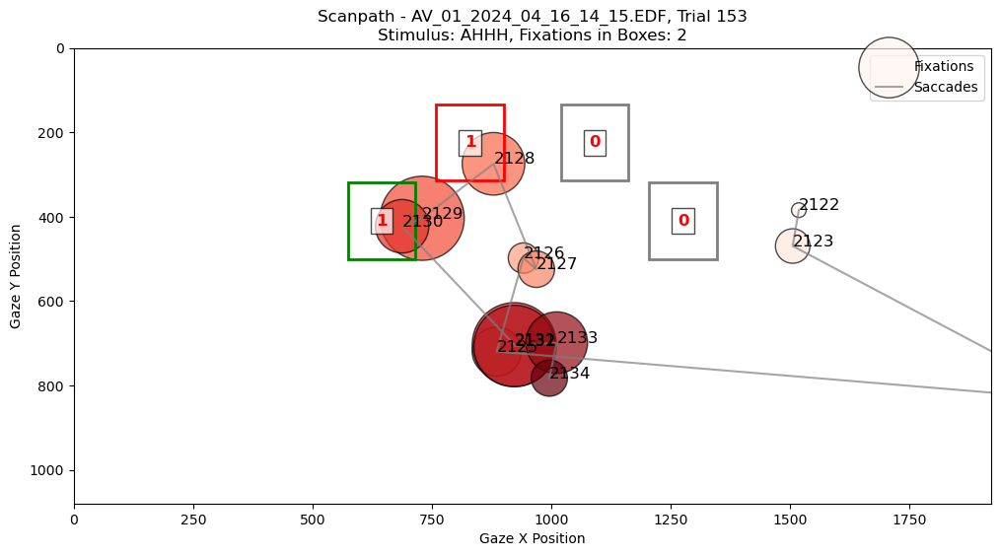

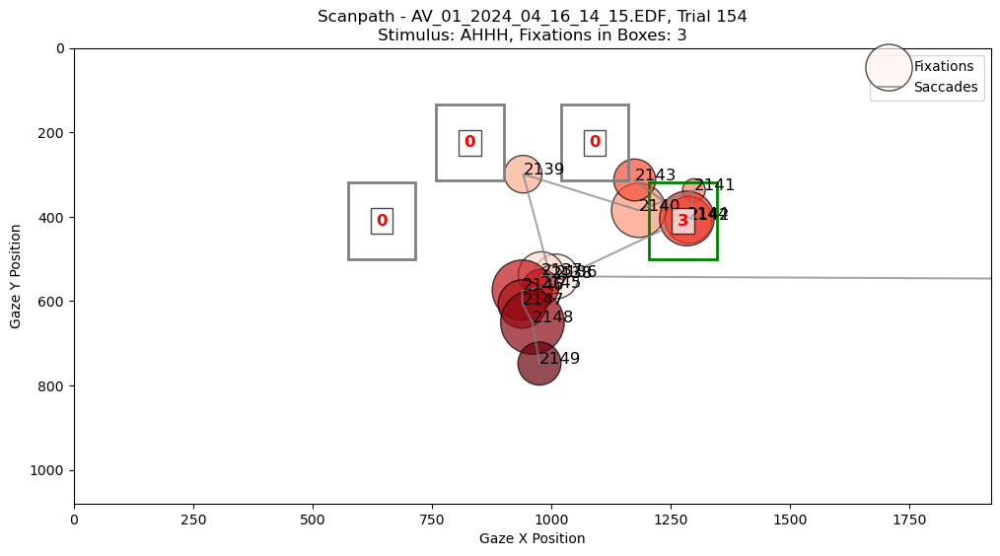

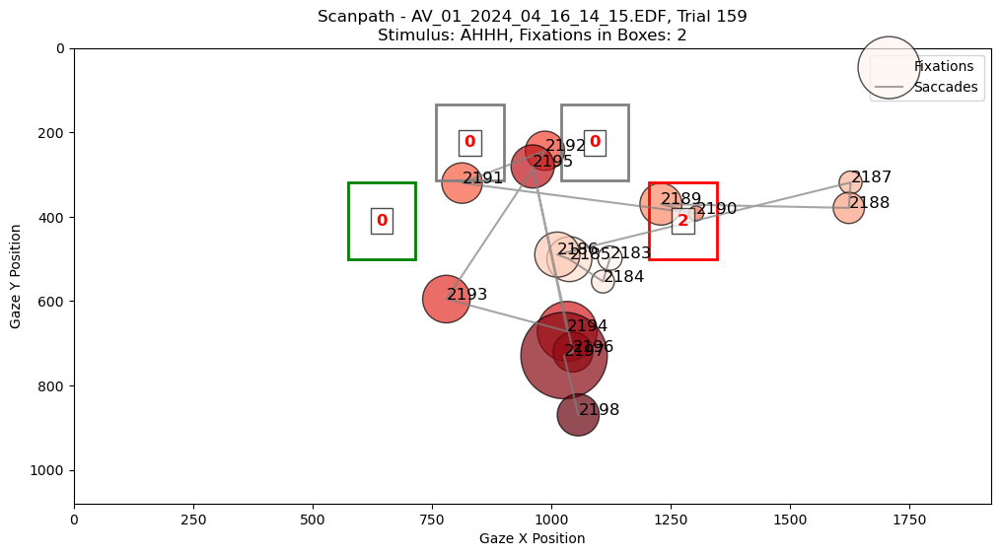

Total Fixations for Participant AV_01_2024_04_16_14_15.EDF, StimOrg AHHH: 0
Total Fixations in Boxes for Participant AV_01_2024_04_16_14_15.EDF, StimOrg AHHH: 45



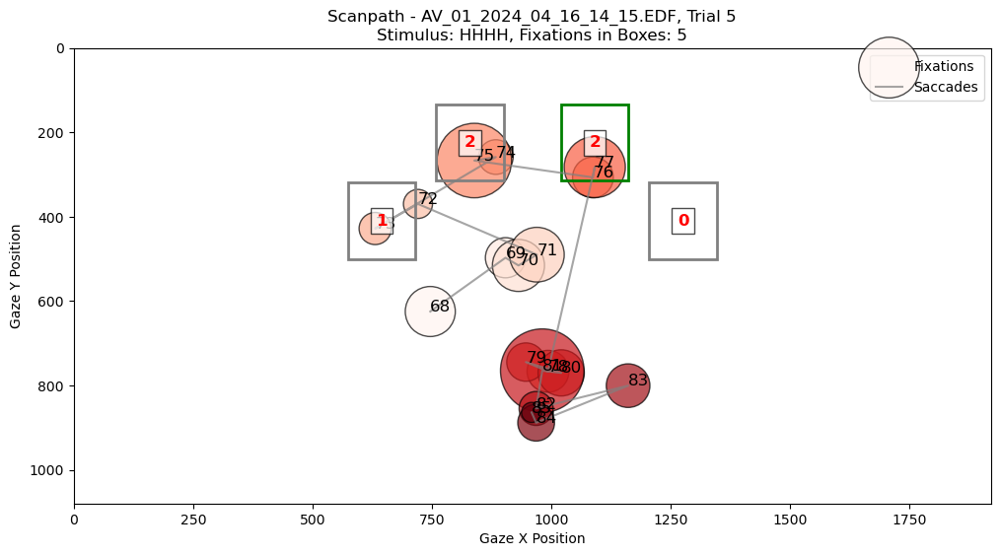

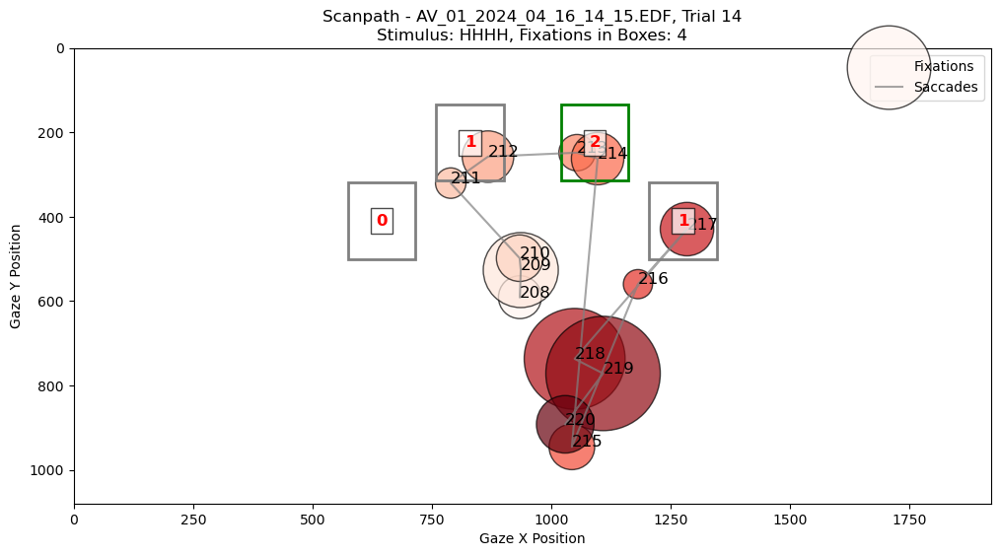

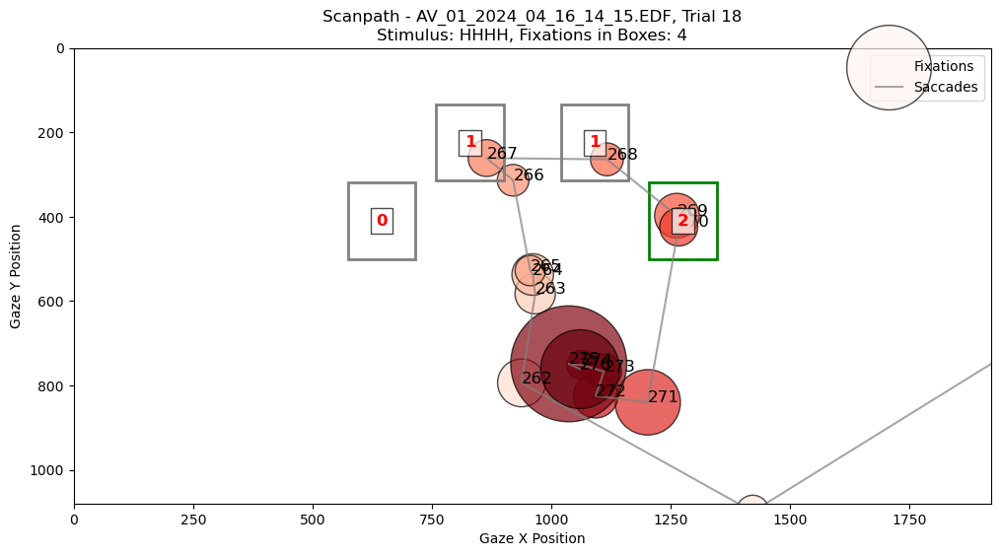

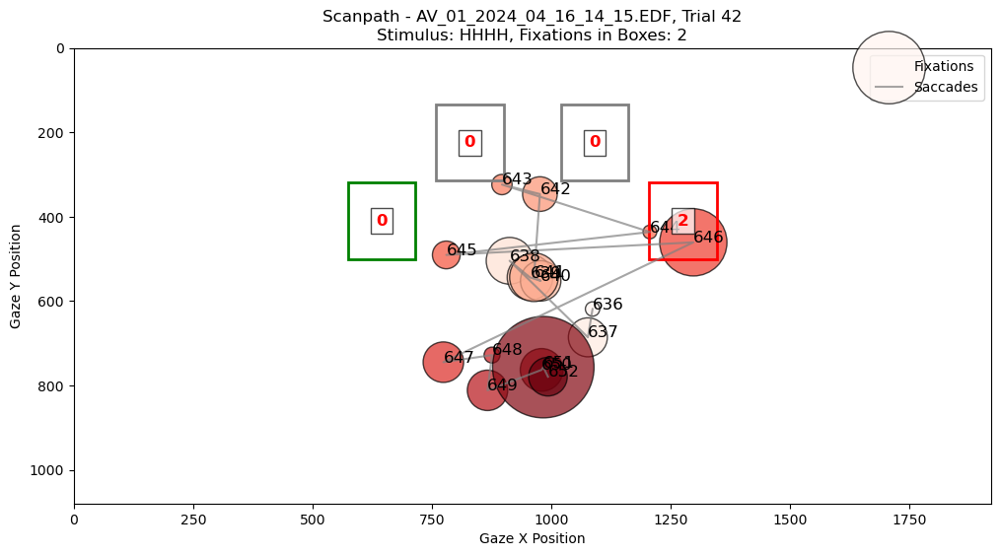

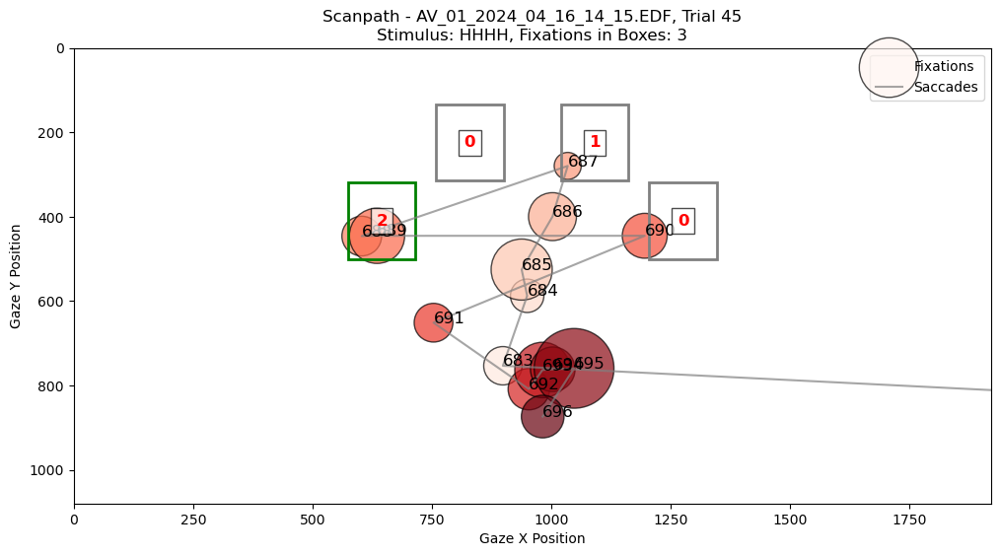

...

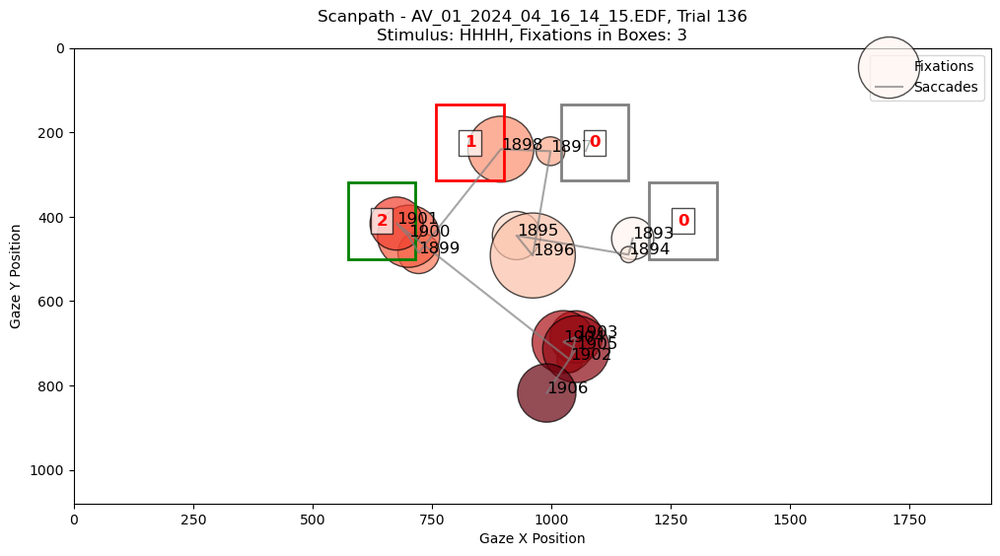

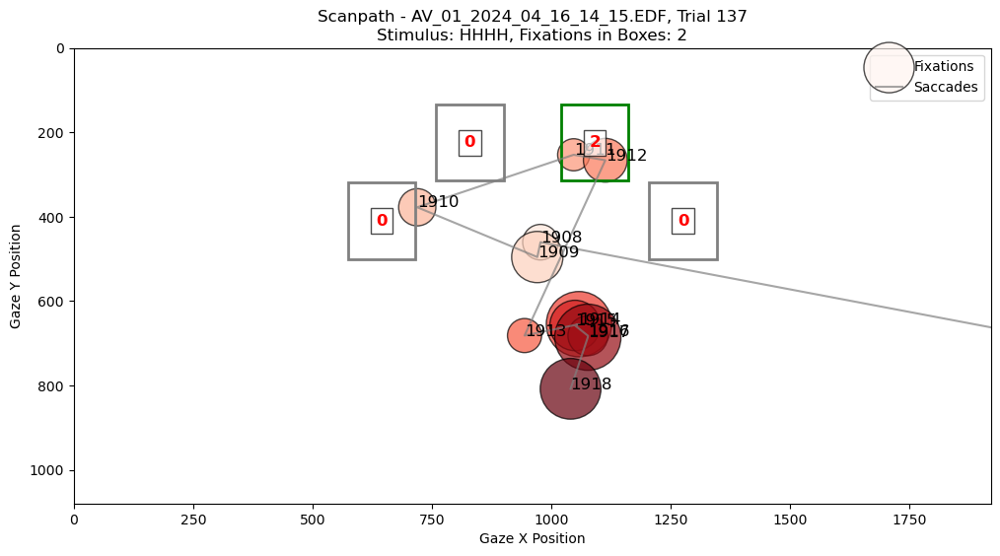

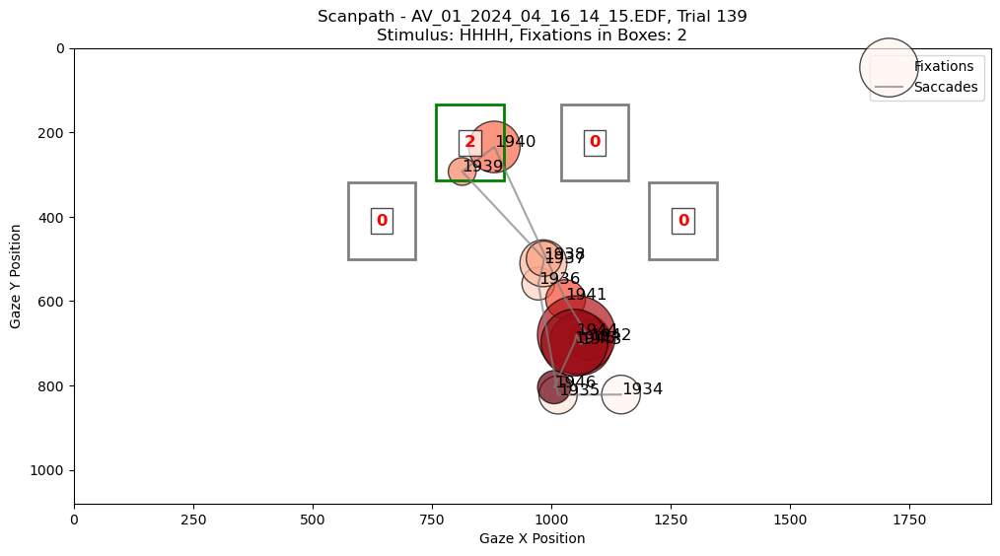

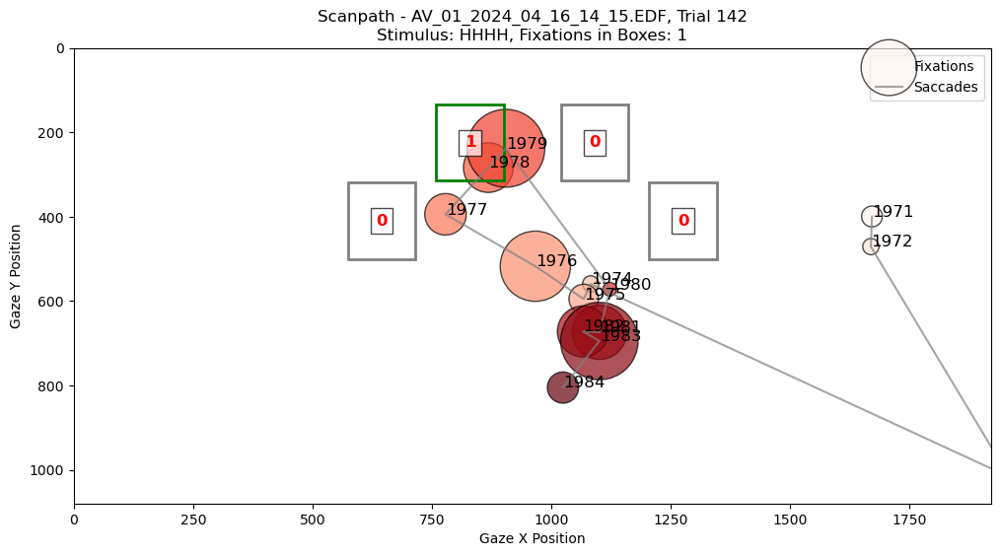

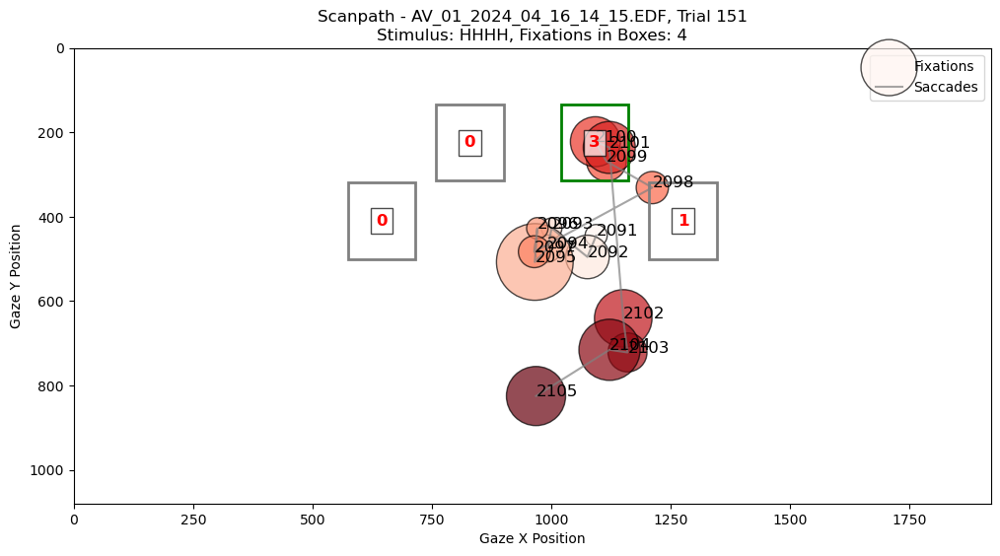

Total Fixations for Participant AV_01_2024_04_16_14_15.EDF, StimOrg HHHH: 0
Total Fixations in Boxes for Participant AV_01_2024_04_16_14_15.EDF, StimOrg HHHH: 50



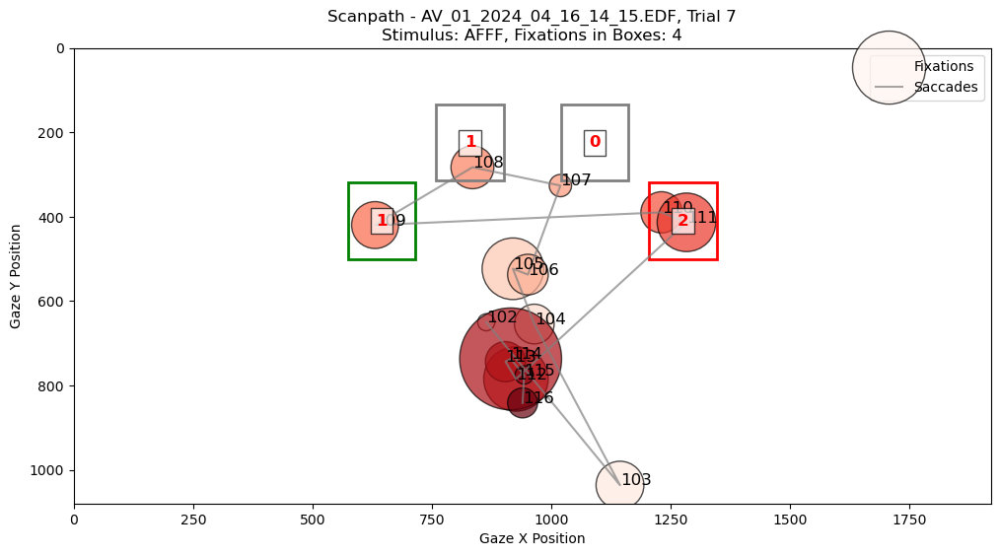

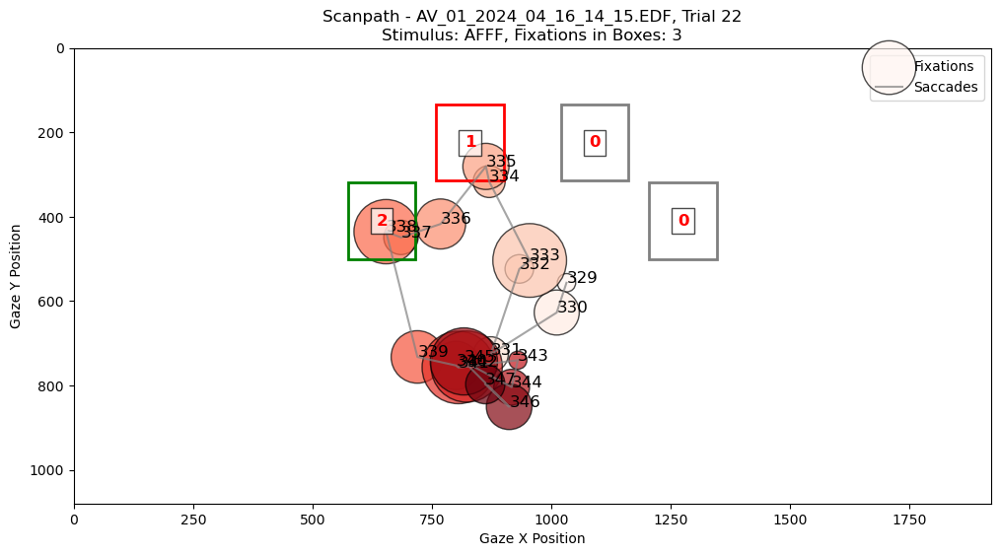

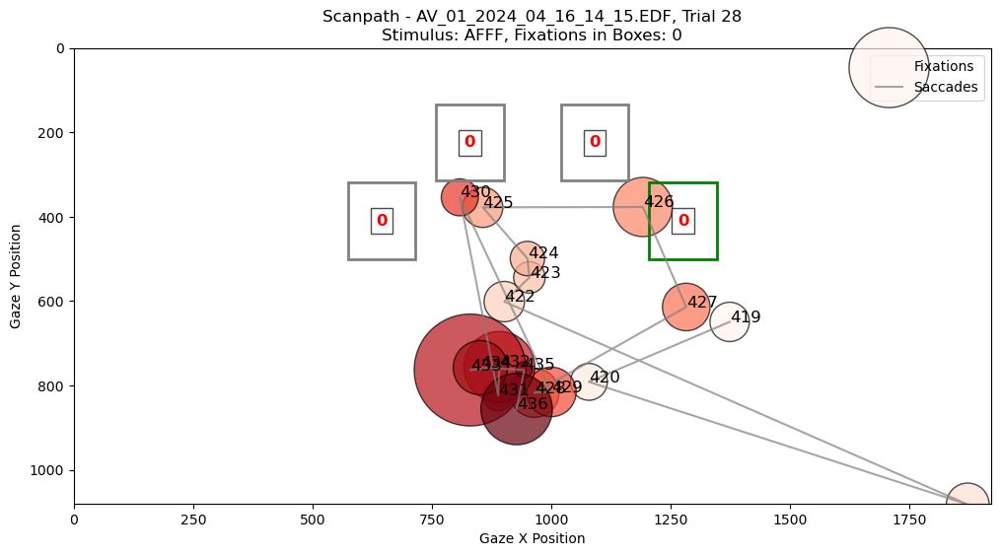

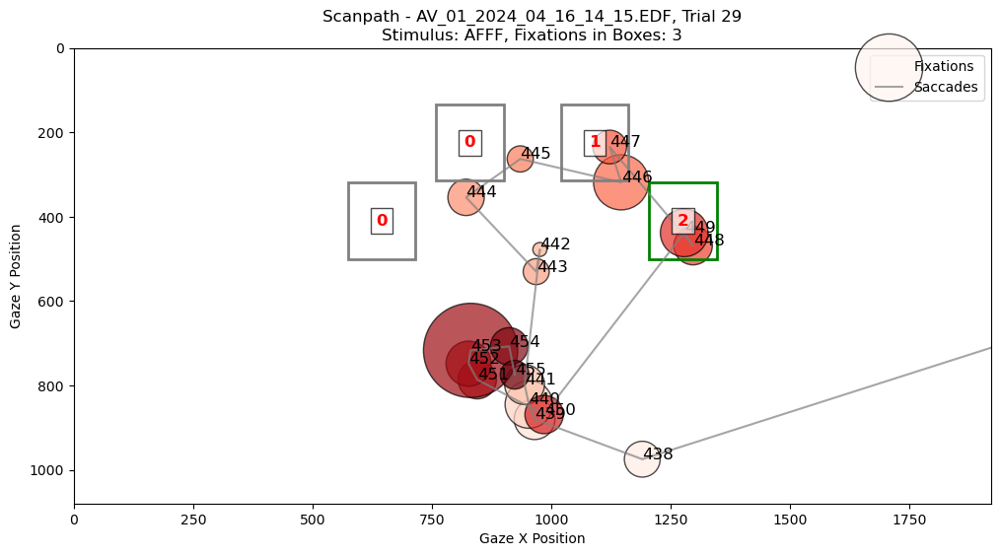

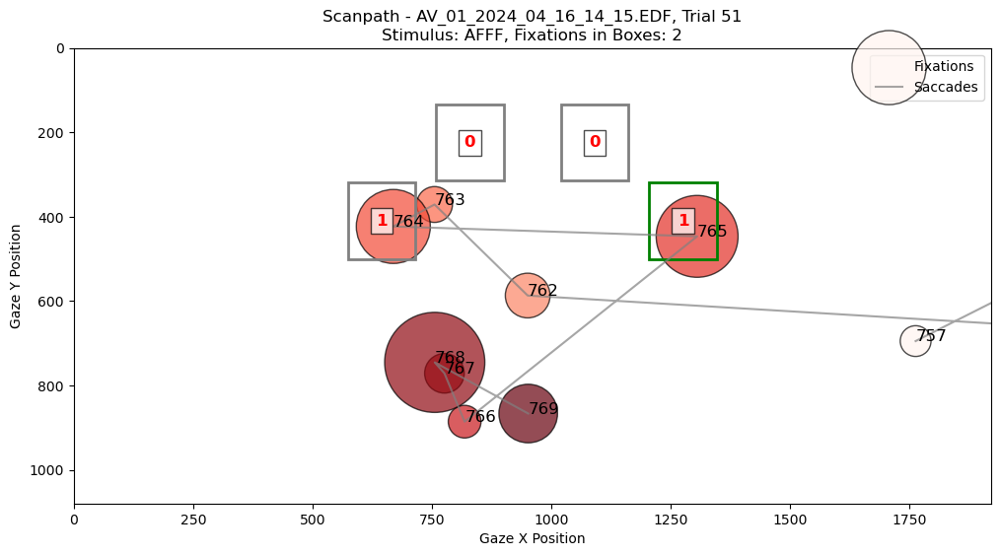

...

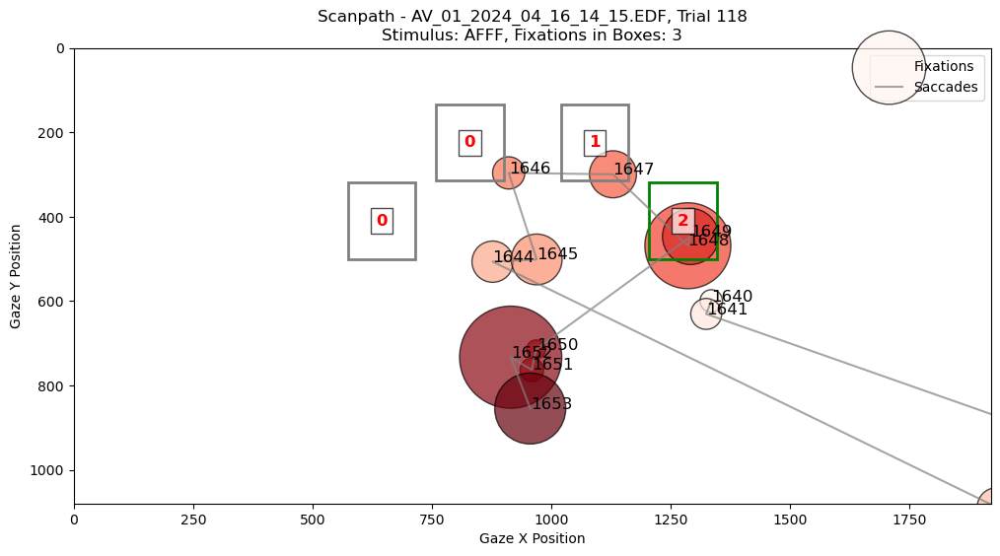

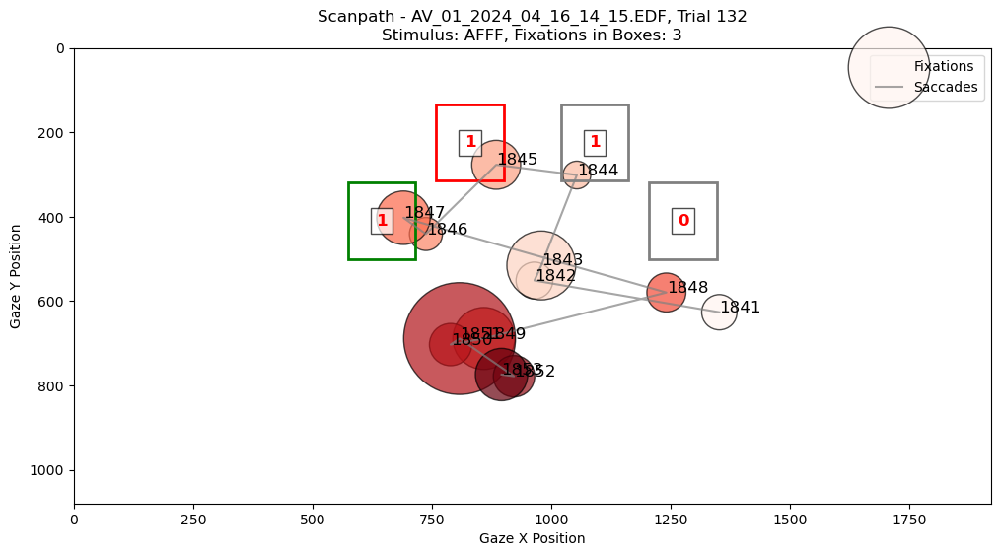

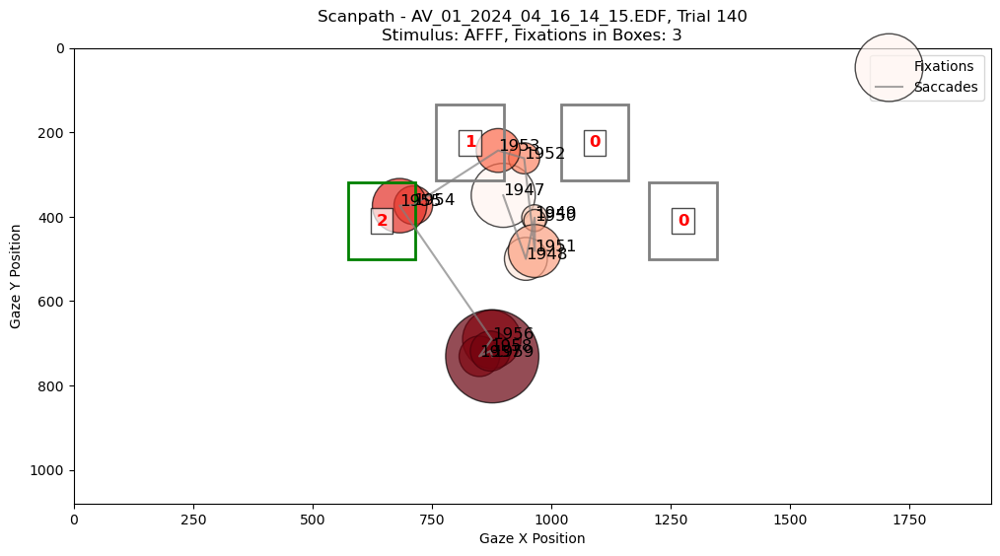

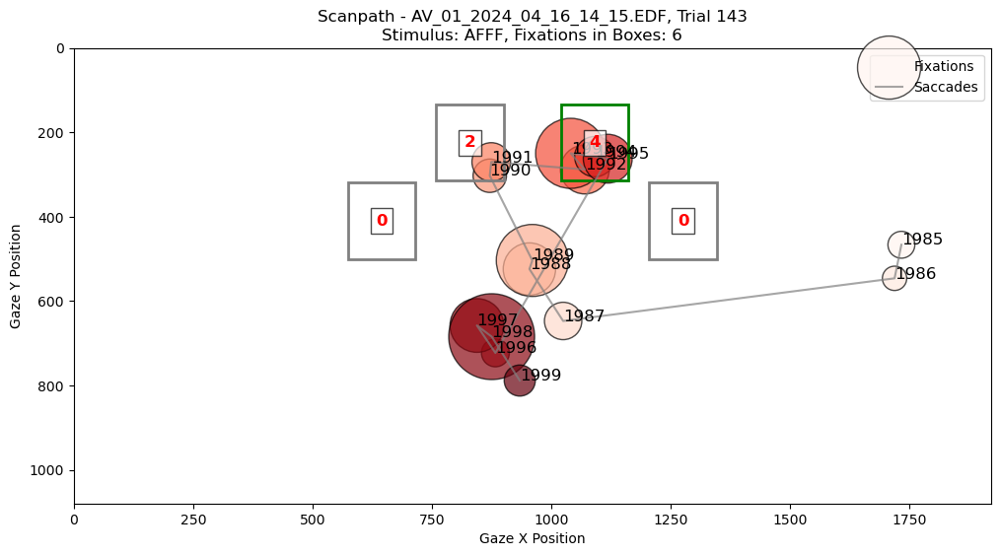

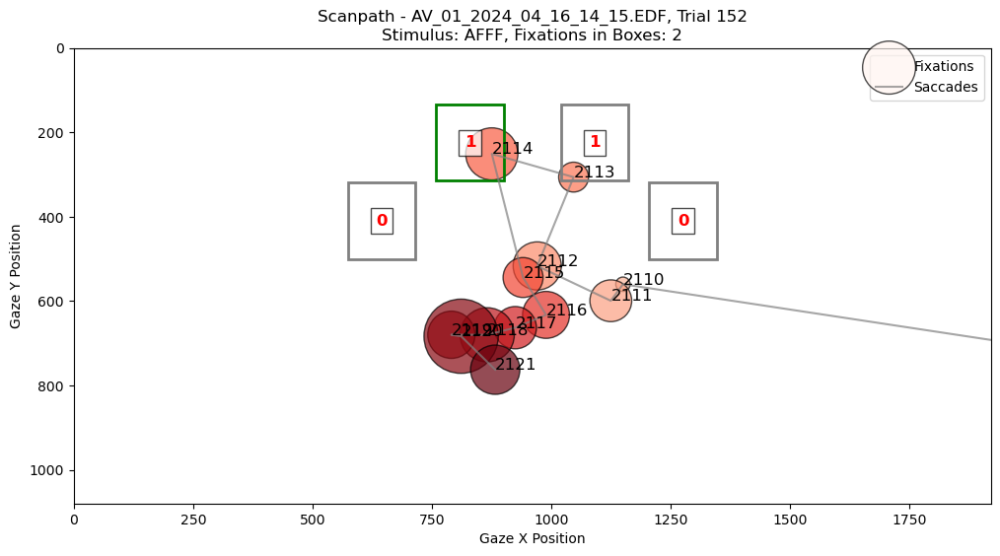

Total Fixations for Participant AV_01_2024_04_16_14_15.EDF, StimOrg AFFF: 0
Total Fixations in Boxes for Participant AV_01_2024_04_16_14_15.EDF, StimOrg AFFF: 41



KeyboardInterrupt: 

In [10]:
import matplotlib.pyplot as plt

def find_last_box_before_exit(fixations, box_positions):
    """Find the last box a fixation was in before leaving all boxes."""
    last_box = None
    for _, row in fixations.iterrows():
        in_box = False
        for box_x, box_y in box_positions:
            if (box_x <= row['gavx'] <= box_x + 141) and (box_y <= row['gavy'] <= box_y + 181):
                last_box = (box_x, box_y)  # Update last seen box
                in_box = True
                break  # No need to check other boxes if already inside one
        
        if not in_box and last_box is not None:
            return last_box  # The last recorded box before exit
    
    return last_box  # If they never leave, just return the last one they were in

# Iterate through each participant and all their trials sequentially
for selected_sub in df_fixations['file_name'].unique():
    participant_id = extract_participant_id(selected_sub)  # Extract ID from file_name

    # Get unique `stimOrg` values for this participant
    stimOrg_list = df_fixations[df_fixations['file_name'] == selected_sub]['stimOrg'].unique()

    for selected_stimOrg in stimOrg_list:
        # Get all trials for this participant and stimOrg
        participant_trials = df_fixations[
            (df_fixations['file_name'] == selected_sub) & 
            (df_fixations['stimOrg'] == selected_stimOrg)
        ]['trial'].unique()

        # Initialize total fixations for this `stimOrg`
        total_fixations_stimOrg = 0
        total_fixations_in_boxes = 0  # Track total fixations inside face boxes
        
        for selected_trial in participant_trials:
            # Filter fixation data for selected participant and trial
            scanpath_data = df_fixations[
                (df_fixations['file_name'] == selected_sub) & 
                (df_fixations['trial'] == selected_trial)
            ]

            if scanpath_data.empty:
                print(f"Warning: No data for {selected_sub}, Trial {selected_trial}")
                continue

            # Retrieve the stimulus for this participant and trial from df_fixations
            stimulus_text = scanpath_data['stimOrg'].iloc[0]
            stim1_pos = scanpath_data['stim1_pos'].iloc[0]
            target_box = coord_to_box.get(str(stim1_pos), None)

            # Sort fixations by time if available
            if 'timestamp' in scanpath_data.columns:
                scanpath_data = scanpath_data.sort_values(by='timestamp')

            # Determine scatter sizes based on fixation duration
            sizes = scanpath_data['duration'] * 5 if 'duration' in scanpath_data.columns else 100  

            # Convert face positions to screen coordinates
            screen_positions = [centered_to_screen(x, y) for x, y in face_positions]

            # Find the last fixation inside a face box before leaving all of them
            last_fixation_box = find_last_box_before_exit(scanpath_data, screen_positions)

            # Count fixations inside boxes
            box_fixation_counts = [count_fixations_in_box(scanpath_data, box_x, box_y) for box_x, box_y in screen_positions]
            fixations_in_boxes = sum(box_fixation_counts)
            total_fixations_in_boxes += fixations_in_boxes  # Add to total inside boxes

            # Plot fixations
            plt.figure(figsize=(12, 6))
            plt.scatter(scanpath_data['gavx'], scanpath_data['gavy'], 
                        c=range(len(scanpath_data)), cmap='Reds', s=sizes, alpha=0.7, 
                        edgecolors='black', label="Fixations")

            # Plot saccades (lines between fixations)
            plt.plot(scanpath_data['gavx'], scanpath_data['gavy'], linestyle='-', color='gray', alpha=0.7, label="Saccades")

            # Annotate fixations with order
            for j, row in scanpath_data.iterrows():
                plt.annotate(str(j), (row['gavx'], row['gavy']), fontsize=12, color='black')

            # Draw face bounding boxes
            for idx, (pos, box_count) in enumerate(zip(screen_positions, box_fixation_counts), start=1):
                box_x, box_y = pos
                box_color = 'green' if idx == target_box else ('red' if last_fixation_box and (box_x, box_y) == last_fixation_box else 'gray')

                rect = plt.Rectangle((box_x, box_y), 141, 181, linewidth=2, edgecolor=box_color, facecolor='none')
                plt.gca().add_patch(rect)

                # Display fixation count inside the box
                plt.text(box_x + 70.5, box_y + 90.5, str(box_count), fontsize=12, color='red', 
                         ha='center', va='center', fontweight='bold', bbox=dict(facecolor='white', alpha=0.7))

            plt.gca().invert_yaxis()
            plt.xlabel("Gaze X Position")
            plt.ylabel("Gaze Y Position")
            plt.xlim(0, 1920)
            plt.ylim(1080, 0)
            plt.title(f"Scanpath - {selected_sub}, Trial {selected_trial}\nStimulus: {stimulus_text}, Fixations in Boxes: {fixations_in_boxes}")
            plt.legend()
            plt.show()

        # Print total fixations summary
        print(f"Total Fixations for Participant {selected_sub}, StimOrg {selected_stimOrg}: {total_fixations_stimOrg}")
        print(f"Total Fixations in Boxes for Participant {selected_sub}, StimOrg {selected_stimOrg}: {total_fixations_in_boxes}\n")
